# U-Net on Graphene Images
This is a modified U-Net architecture on the Oxford-IIIT Pet Dataset. The original code can be found at https://colab.research.google.com/github/zaidalyafeai/Notebooks/blob/master/unet.ipynb

Mount Google Drive and define path to dataset. There are two paths: one to the dataset (dataset_dir) and another to the folder which you put `utils.py' in (project_dir).

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Model Paths

In [ ]:
# Import the libraries for use
import os
import sys
import time

# directory of the project, folder which you put utils.py in
project_dir = os.path.abspath("/content/gdrive/Shared drives/Graphene_DL_2")

# path to the dataset, should contain 3 subfolders: train2019, val2019 and annotations
dataset_dir = os.path.abspath("/content/gdrive/Shared drives/Graphene_DL_2")

# UNet model path
model_path = "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/Five_layer_good_model.h5"
model_path1 = "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/Good_model7.h5"

# BT - Net path
RGB_model_path = "/content/gdrive/Shared drives/Graphene_DL_2/Unet_h5_files/RGB_bilayer_with_attached_lr_00008_ep600_PW06_normal_loss_th_084_2.h5"

sys.path.append(project_dir)  # To find local version of the library: utils

# import utils.py to read coco dataset
import utils

# Impoort Libraries

In [ ]:
from tensorflow.keras.utils import get_custom_objects
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import tensorflow.keras as keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input, Conv2DTranspose, Concatenate
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
import tensorflow as tf
import cv2
from imgaug import augmenters as iaa

# Define hyper-parameters

In [ ]:
epochs = 0 # No. of training epochs
batch_size = 32
default_learning_rate = 0.0015

# Define U-Net input image size
default_input_size = (256, 256, 3)

# Define weight of positive errors
pos_weight = 120

# Start training your model. Set to 0 if you want to train from scratch
initial_epoch = 0

# Probability threshold for output masks
prob_threshold = 0.5


# Image Augmentation

In [ ]:
# first crop images at a random position
# then randomly apply 0 to 4 of the methods: horizontally flip, vertically flip, rotate and shift
seq_train = iaa.Sequential([
            iaa.SomeOf((0, 4),[
                iaa.Fliplr(), # horizontally flip
                iaa.Flipud(), # vertically flip
                iaa.Affine(rotate=(0,359)), # rotate
                iaa.Affine(translate_percent={"x": (-0.1, 0.1),"y": (-0.1, 0.1)}), # shift
    ])
])


# Generator function for UNet


In [ ]:
def image_generator(dataset, seq = None, batch_size = 32, image_size = (1024,1024)):
  
  while True: 
    
    # extract a random batch 
    batch = np.random.choice(dataset.image_ids, size = batch_size)    
    
    # variables for collecting batches of inputs and outputs 
    batch_x = []
    batch_y = []
    
    if seq: # apply augmentation
      # make stochastic augmenter deterministic (similar to drawing random samples from a distribution)
        seq_det = seq.to_deterministic()

    for f in batch:

        #preprocess the raw images 
        raw = dataset.load_image(f)
        raw = np.clip(cv2.resize(raw, dsize=image_size,interpolation=cv2.INTER_CUBIC),0, 255)

        # get the mask
        mask = np.clip(np.sum(dataset.load_mask(f)[0], axis = -1, keepdims = True), a_min=0, a_max=1)
        mask = cv2.resize(mask.astype(np.float32), dsize = image_size, interpolation = cv2.INTER_CUBIC)

        # pre-process the mask 
        mask[mask != 0 ] = 1
        batch_x.append(raw)
        batch_y.append(mask)

    # pre-process a batch of images and masks 
    batch_x = np.array(batch_x)/255. # normalize raw images
    batch_y = np.expand_dims(np.array(batch_y), 3)# add color channel to the black-and-white masks

    if seq:
        # augment images and masks
        batch_x = np.array(seq_det.augment_images(batch_x))
        batch_y = np.array(seq_det.augment_images(batch_y))

    yield (batch_x, batch_y)

In [ ]:
# build a CocoDataset object for training images
dataset_train = utils.CocoDataset()
dataset_train.load_coco(dataset_dir, "train")
dataset_train.prepare()

# build a CocoDataset object for validation images
dataset_val = utils.CocoDataset()
dataset_val.load_coco(dataset_dir, "val")
dataset_val.prepare()

# build generators for training and testing
train_generator = image_generator(dataset_train,seq = seq_train, batch_size = batch_size,image_size = default_input_size[:2])
test_generator  = image_generator(dataset_val,seq = None, batch_size = batch_size,image_size = default_input_size[:2])

loading annotations into memory...
Done (t=0.60s)
creating index...
index created!
loading annotations into memory...
Done (t=0.59s)
creating index...
index created!


# Test the generators by plotting

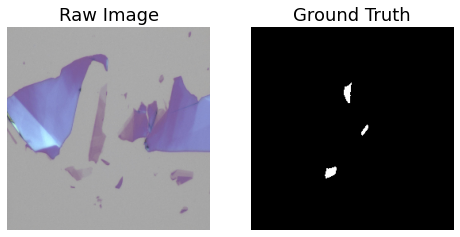

In [ ]:
x, y= next(test_generator)
img = x[0]
msk = y[0].squeeze()
msk = np.stack((msk,) * 3, axis = -1)

fig, ax = plt.subplots(1, 2, figsize = (8,16))
[axi.set_axis_off() for axi in ax.ravel()]
ax[0].imshow(img)
ax[0].set_title('Raw Image',fontsize=18)
ax[1].imshow(msk)
ax[1].set_title('Ground Truth',fontsize=18)
plt.show()

# IoU metric

The intersection over union (IoU) metric is a simple metric used to evaluate the performance of a segmentation algorithm. Given two masks $y_{true}, y_{pred}$ we evaluate 

$$IoU = \frac{y_{true} \cap y_{pred}}{y_{true} \cup y_{pred}}$$

In [ ]:
def mean_iou(y_true, y_pred):
    yt0 = y_true[:,:,:,0]
    yp0 = K.cast(y_pred[:,:,:,0] > 0.5, 'float32')
    inter = tf.math.count_nonzero(tf.math.logical_and(tf.equal(yt0, 1), tf.equal(yp0, 1)))
    union = tf.math.count_nonzero(tf.add(yt0, yp0))
    iou = tf.where(tf.equal(union, 0), 1., tf.cast(inter/union, 'float32'))
    return iou

# Weighted binary crossentropy loss 
Assume we have $N$ samples in total, $y_{true}$ is a ground truth segmentation mask, $y_{pred}$ is the CNN-predicted segmentation mask, the binary crossentropy is defined as:
$$L_{binary\_ce} = -\frac{1}{N}\sum_{1}^{N}y_{true} * log(y_{pred})+(1-y_{true})*log(1-y_{pred})$$
And weighted binary crossentropy is defined as:
$$L_{w\_binary\_ce} = -\frac{1}{N}\sum_{1}^{N} w * y_{true} * log(y_{pred})+(1-y_{true})*log(1-y_{pred})$$
Here, $w$ represents the weight for positive errors. Weighted loss here is used to handle class imbalance in the dataset.

In [ ]:
def create_weighted_binary_crossentropy(pos_weight):

    def weighted_binary_crossentropy(y_true, y_pred):

        # Calculate the binary crossentropy
        b_ce = K.binary_crossentropy(y_true, y_pred)

        # Apply the weights
        weight_vector = y_true * pos_weight + (1. - y_true)
        weighted_b_ce = weight_vector * b_ce

        # Return the mean error
        return K.mean(weighted_b_ce)

    return weighted_binary_crossentropy 

# Define model function

In [ ]:
def unet(sz = default_input_size):
  x = Input(sz) # input image with 3 channels, image size = 256 x 256
  inputs = x # Assign the value of x to inputs 
  
  #downsampling 
  f = 8 # number of filters
  layers = [] # Create a list to store the outputs from each box
  
  for i in range(6):
    x = Conv2D(f, 3, activation = 'relu', padding = 'same') (x)
    x = Conv2D(f, 3, activation = 'relu', padding = 'same') (x)
    layers.append(x) # append the output from each box to layers
    x = MaxPooling2D() (x)
    f = f * 2 

  ff2 = 64 

  #bottleneck 
  j = len(layers) - 1 # 6 - 1 = 5 in our case
  x = Conv2D(f, 3, activation = 'relu', padding = 'same') (x)
  x = Conv2D(f, 3, activation = 'relu', padding = 'same') (x)
  x = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same') (x)
  x = Concatenate(axis = 3)([x, layers[j]])
  j = j -1 
  
  #upsampling 
  for i in range(5):
    ff2 = ff2//2
    f = f // 2 
    x = Conv2D(f, 3, activation = 'relu', padding='same') (x)
    x = Conv2D(f, 3, activation = 'relu', padding='same') (x)
    x = Conv2DTranspose(ff2, 2, strides = (2, 2), padding = 'same') (x)
    x = Concatenate(axis = 3)([x, layers[j]])
    j = j - 1 
  
  #classification 
  x = Conv2D(f, 3, activation = 'relu', padding = 'same') (x)
  x = Conv2D(f, 3, activation = 'relu', padding = 'same') (x)
  outputs = Conv2D(1, 1, activation = 'sigmoid') (x)
  
  #model creation 
  model = Model(inputs = [inputs], outputs = [outputs])
  opt = keras.optimizers.Adam(learning_rate = default_learning_rate) # choose Adam as the optimizer
  model.compile(optimizer = opt, loss = create_weighted_binary_crossentropy(pos_weight), metrics = [mean_iou])
  
  return model


# Define custom callbacks

In [ ]:
def build_callbacks():
  checkpointer = ModelCheckpoint(filepath = model_path, verbose = 0, save_best_only = True, save_weights_only = False)
  callbacks = [checkpointer, PlotLearning()]
  return callbacks

# inheritance for training process plot 
class PlotLearning(keras.callbacks.Callback):

    def on_train_begin(self, logs = {}):
        self.i = 0
        self.x = []
        self.losses = []
        self.val_losses = []
        self.acc = []
        self.val_acc = []
        self.logs = []

    def on_epoch_end(self, epoch, logs = {}):
        self.logs.append(logs)
        self.x.append(epoch)
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        self.acc.append(logs.get('mean_iou'))
        self.val_acc.append(logs.get('val_mean_iou'))
        print('epoch =',epoch,'loss=',logs.get('loss'),'val_loss=',logs.get('val_loss'),'mean_iou=',logs.get('mean_iou'),'val_mean_iou=',logs.get('val_mean_iou'))
        
        #choose a test image and preprocess
        # path = np.random.choice(dataset_val.image_ids)
        raw = cv2.resize(dataset_val.load_image(0),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255.
        # get ground truth mask
        mask = np.clip(np.sum(dataset_val.load_mask(0)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
        mask = cv2.resize(mask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)

        # pre-process the mask 
        mask[mask != 0 ] = 1
        # mask = np.tile(mask[:,:,np.newaxis], (1,1,3))

        #predict the mask 
        pred = model.predict(np.expand_dims(raw, 0))
        
        # predicted mask post-processing 
        pred  = pred.squeeze()

        pred_mask = np.array(pred)
        pred_mask = exponen(pred_mask)
       
        #show the mask and the segmented image 
        fig, ax = plt.subplots(1,4,figsize=(10, 40))
        [axi.set_axis_off() for axi in ax.ravel()]
        ax[0].imshow(raw)
        ax[0].set_title('Image',fontsize=14)
        ax[1].imshow(mask,cmap='gray')
        ax[1].set_title('Ground Truth',fontsize=14)
        ax[2].imshow(pred,cmap='gray')
        ax[2].set_title('Prediction',fontsize=14)
        ax[3].imshow(pred_mask,cmap='gray')
        ax[3].set_title('Post-processed prediction',fontsize=14)

        plt.show()

# Build the model and train

In [ ]:
train_steps = dataset_train.num_images // batch_size 
test_steps = dataset_val.num_images // batch_size 

if os.path.isfile(model_path):
    get_custom_objects().update({"weighted_binary_crossentropy": create_weighted_binary_crossentropy(pos_weight),
                                 "mean_iou": mean_iou})
    model_attached = load_model(model_path) 
else:
    initial_epoch = 0
    model_attached = unet_attached()

history = model_attached.fit(train_generator, 
          epochs = epochs,
          initial_epoch = initial_epoch,
          steps_per_epoch = train_steps,
          validation_data = test_generator,
          validation_steps = test_steps,
          callbacks = build_callbacks(),
          verbose = 0)
model_attached.summary()

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_64 (Conv2D)              (None, 256, 256, 8)  224         input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_65 (Conv2D)              (None, 256, 256, 8)  584         conv2d_64[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_12 (MaxPooling2D) (None, 128, 128, 8)  0           conv2d_65[0][0]                  
_______________________________________________________________________________________

In [ ]:
# set font size for all elements in plot
plt.rcParams.update({'font.size': 14})

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

f = open("loss.txt","w") #opens file with name of "test.txt"
f1 = open("val_loss.txt","w")
f.write(str(history.history['loss']).strip('[]'))
f1.write(str(history.history['val_loss']).strip('[]'))
f.close()
f1.close()

# Plot training and validation loss vs epoch

Plot raw images, ground truth masks and prediction results for the UNet architecture

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.03438901901245117
0.03561374061558503


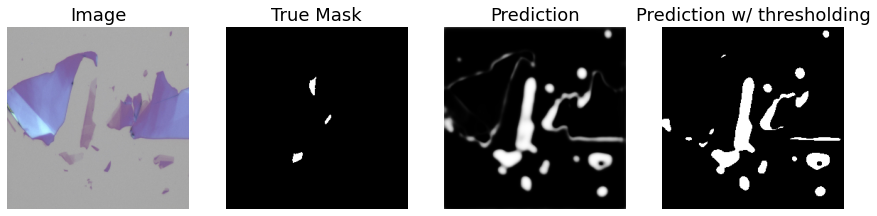

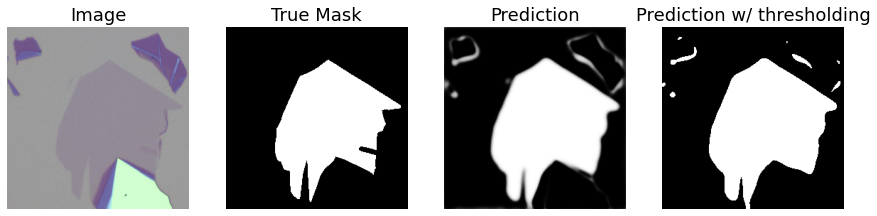

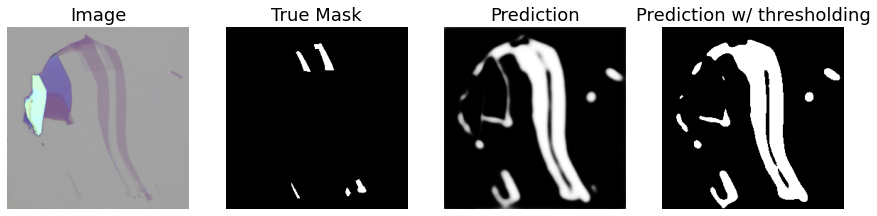

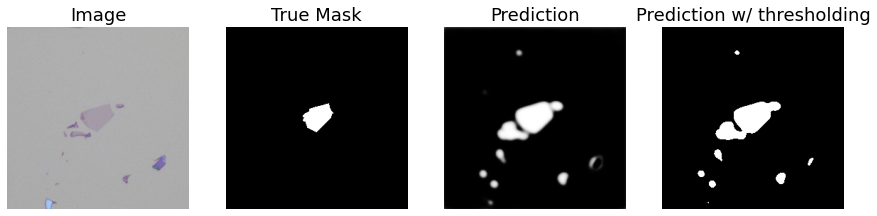

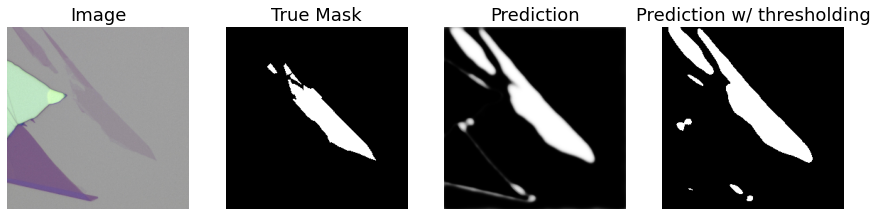

...

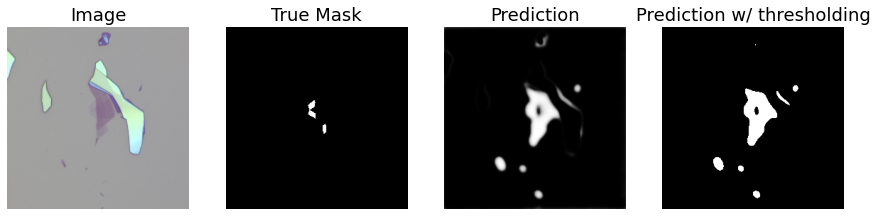

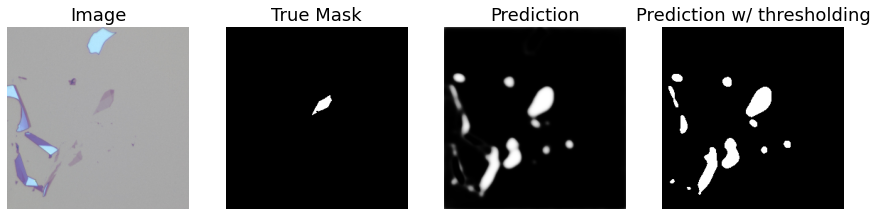

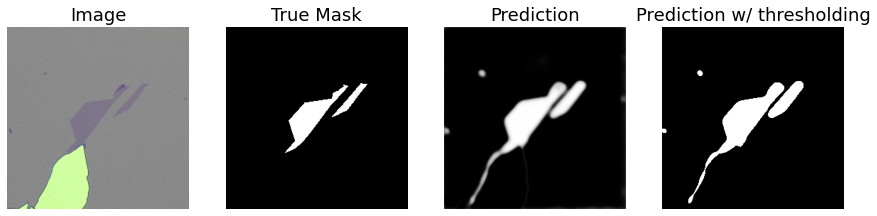

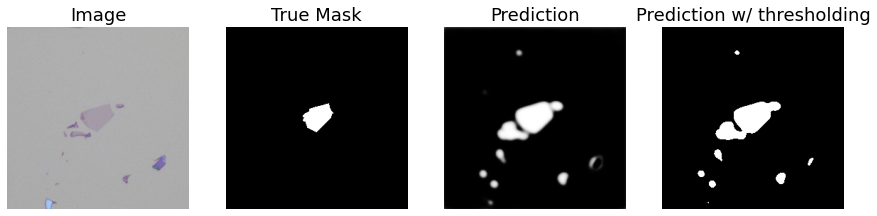

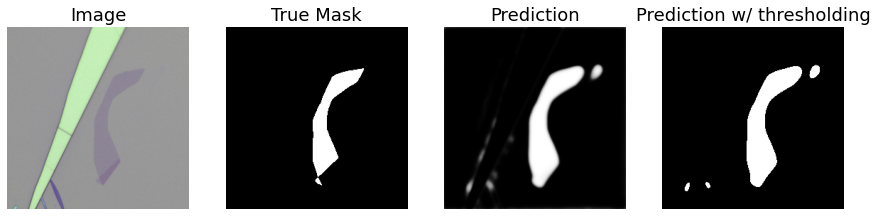

In [ ]:
for i in range(32):  
  img = x[i]
  msk = y[i].squeeze()
  pred = model_attached.predict(np.expand_dims(img, 0)).squeeze()
  pred_mask = (pred>=prob_threshold).astype(np.float32)


  fig, ax = plt.subplots(1,4,figsize=(15,60))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(img)
  ax[0].set_title('Image',fontsize=18)
  ax[1].imshow(msk,cmap='gray')
  ax[1].set_title('True Mask',fontsize=18)
  ax[2].imshow(pred,cmap='gray')
  ax[2].set_title('Prediction',fontsize=18)
  ax[3].imshow(pred_mask,cmap='gray')
  ax[3].set_title('Prediction w/ thresholding',fontsize=18)

total_msk_graphene = np.sum(y)
grd_graphene_to_whole_image = total_msk_graphene/(256*256*32)
grd_graphene_to_bg = total_msk_graphene/(256*256*32 - total_msk_graphene)
print(grd_graphene_to_whole_image)
print(grd_graphene_to_bg)

# UNet Evaluation metrics definitions

In [ ]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision
    
def false_alarm_m(y_true, y_pred):
    false_positives = K.sum(K.round(K.clip((1 - y_true) * y_pred, 0, 1)))
    true_negatives = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    false_alarm = false_positives / (false_positives + true_negatives)
    return false_alarm 

<tf.Tensor: shape=(), dtype=float32, numpy=1.0>

# Evaluation metrics calculations

In [ ]:
def compute_recall_precision(dataset, sz = default_input_size[:2]):    
    recall = 0
    precision = 0
    false_alarm = 0
    
    
    for im_id in dataset.image_ids:

        #get the mask
        mask = np.clip(np.sum(dataset.load_mask(im_id)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
        mask = cv2.resize(mask.astype(np.float32), dsize=sz, interpolation=cv2.INTER_CUBIC)

        # pre-process the mask 
        mask[mask != 0 ] = 1
        
        #preprocess the raw images 
        raw = cv2.resize(dataset.load_image(im_id), dsize=sz, interpolation=cv2.INTER_CUBIC)

        pred_mask = model_attached.predict(np.expand_dims(raw/255., 0)).squeeze()

        # Threshold it to 0 or 1
        pred_mask = (pred_mask >= 0.55).astype(np.float32)


        recall += recall_m(mask,pred_mask)
        precision += precision_m(mask,pred_mask)
        false_alarm += false_alarm_m(mask,pred_mask)

    recall/=len(dataset.image_ids)
    precision/=len(dataset.image_ids)
    false_alarm /= len(dataset.image_ids)
    return (recall,precision, false_alarm)

Print UNet training model validation result

In [ ]:
rec_val, prec_val, false_ala_val = compute_recall_precision(dataset_val)
print(rec_val, prec_val, false_ala_val)

tf.Tensor(0.99586254, shape=(), dtype=float32) tf.Tensor(0.3664493, shape=(), dtype=float32) tf.Tensor(0.051093858, shape=(), dtype=float32)


Print UNet training model training result

In [ ]:
rec_train, prec_train, false_ala_train = compute_recall_precision(dataset_train)
print(rec_train, prec_train, false_ala_train)

tf.Tensor(0.992447, shape=(), dtype=float32) tf.Tensor(0.44562104, shape=(), dtype=float32) tf.Tensor(0.04643968, shape=(), dtype=float32)


Print the validation data ground truths

0


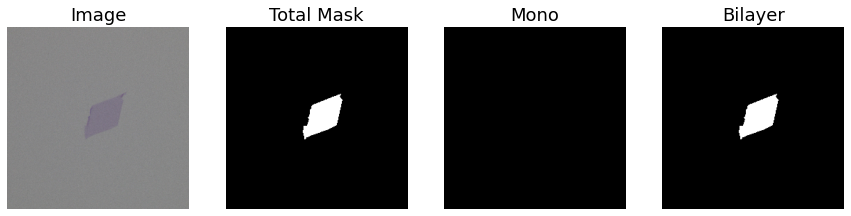

1


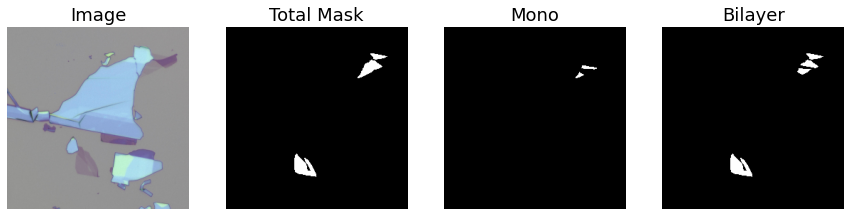

2


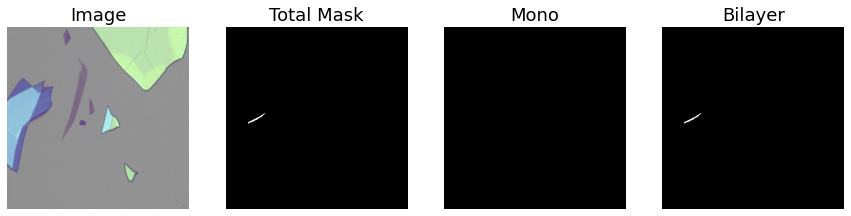

3


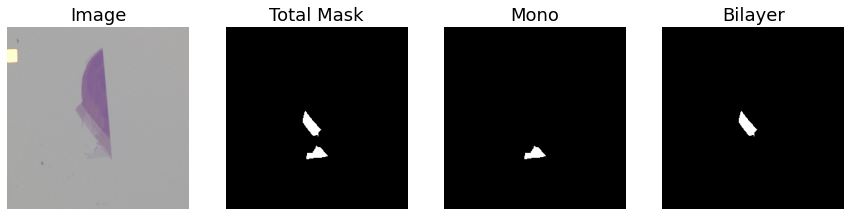

4


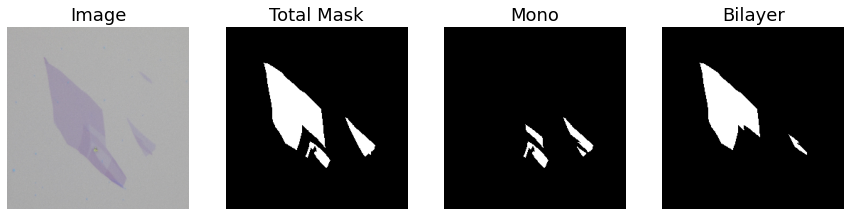

5


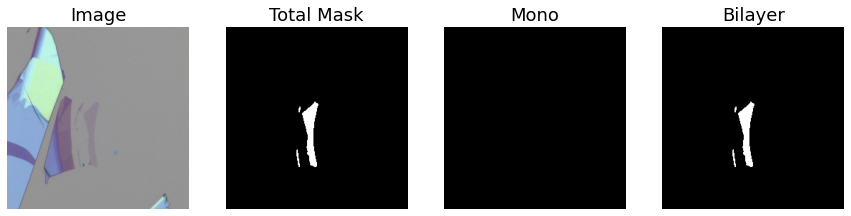

6


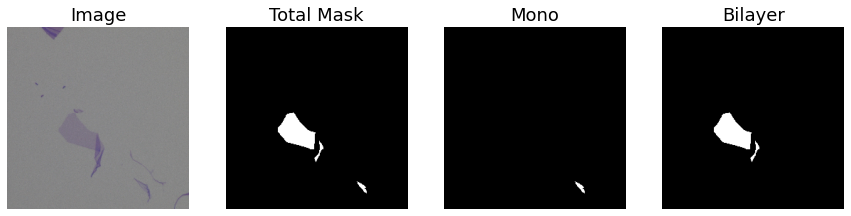

7


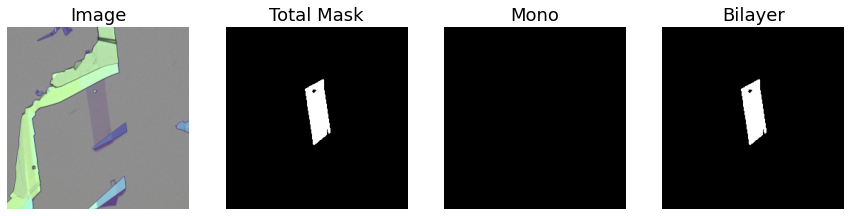

8


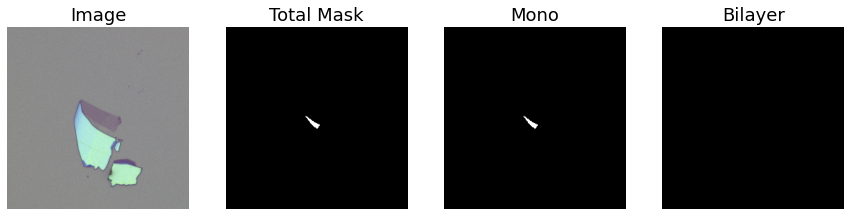

9


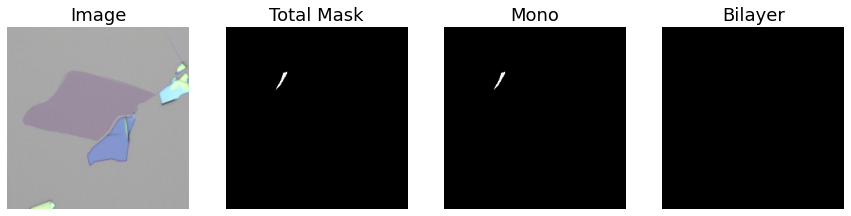

10


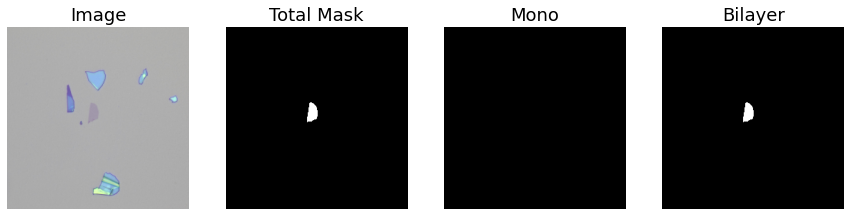

11


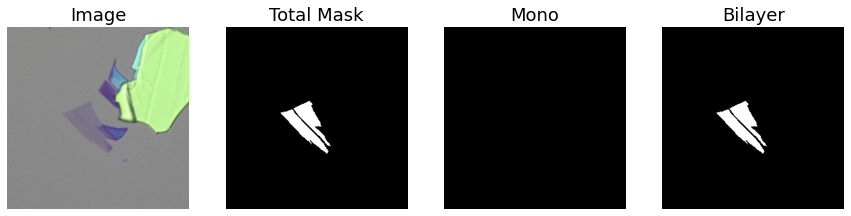

12


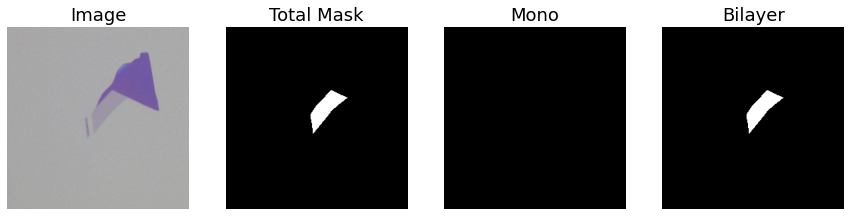

13


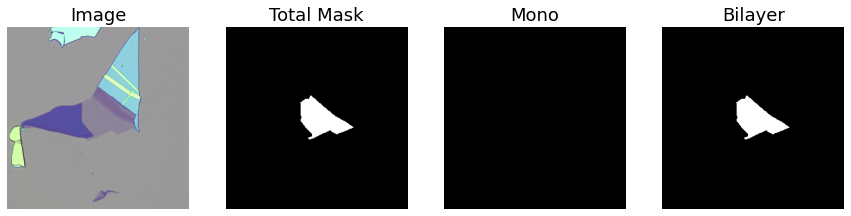

14


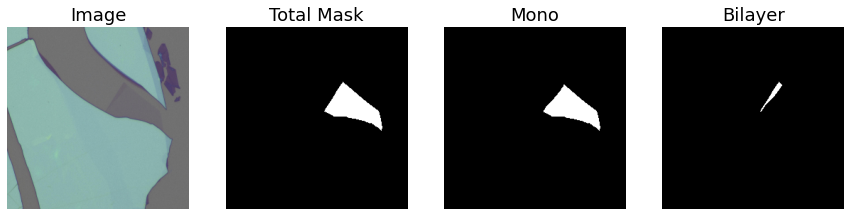

15


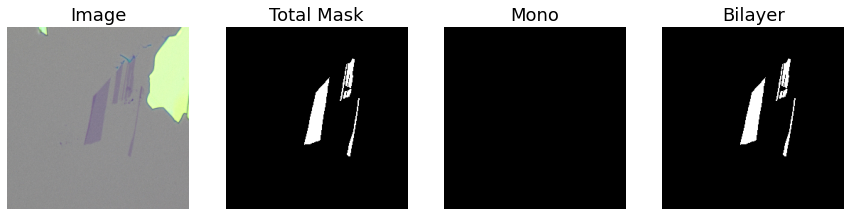

16


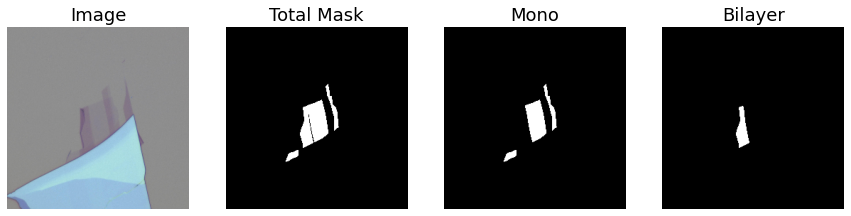

17


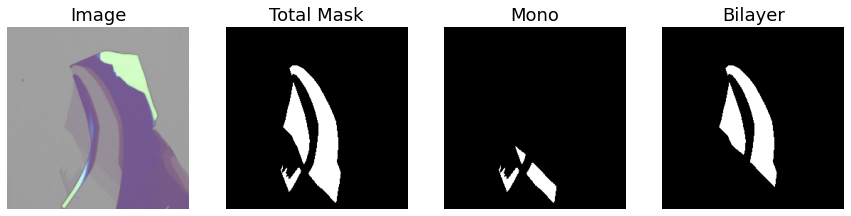

18


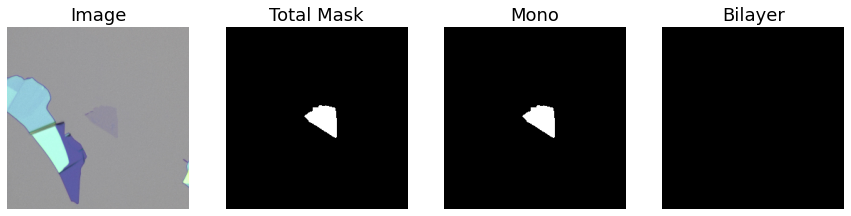

19


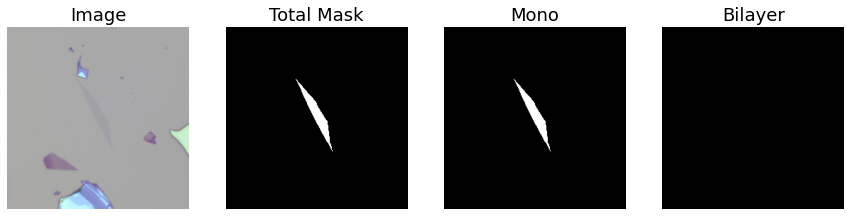

20


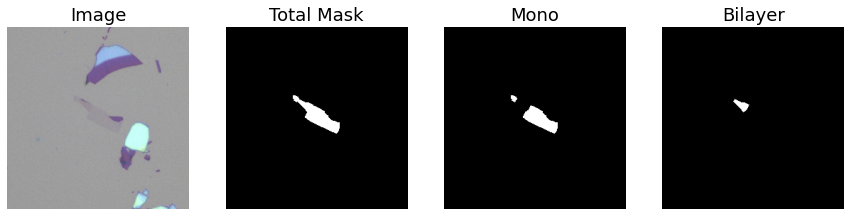

21


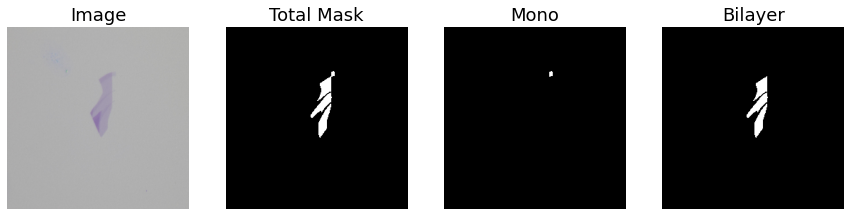

22


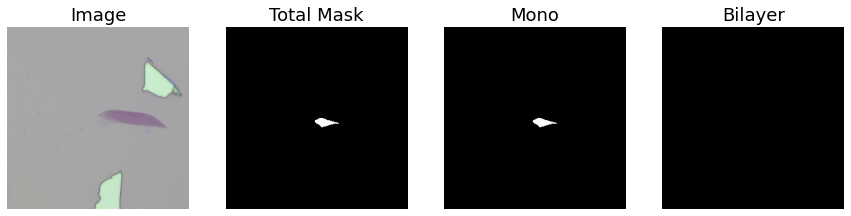

23


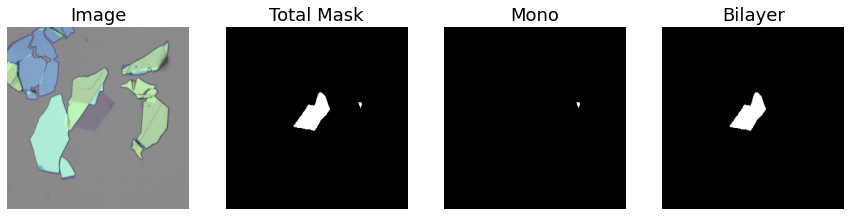

24


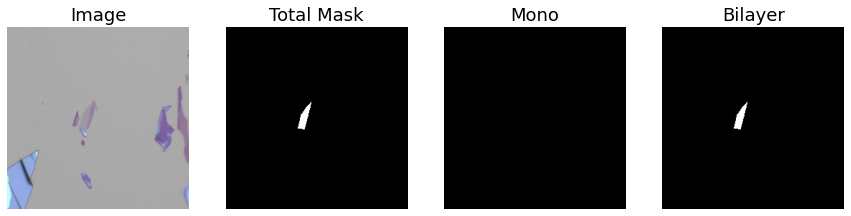

25


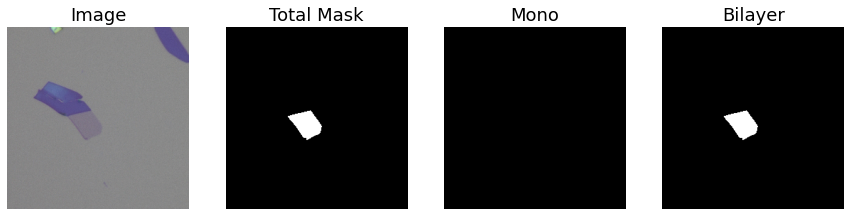

26


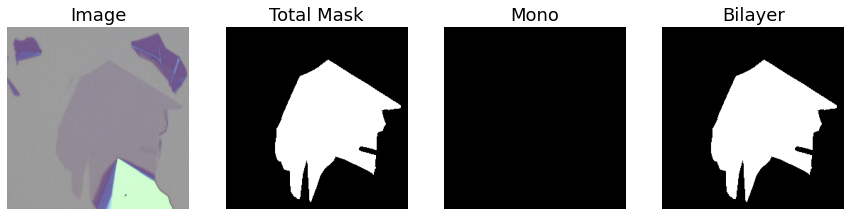

27


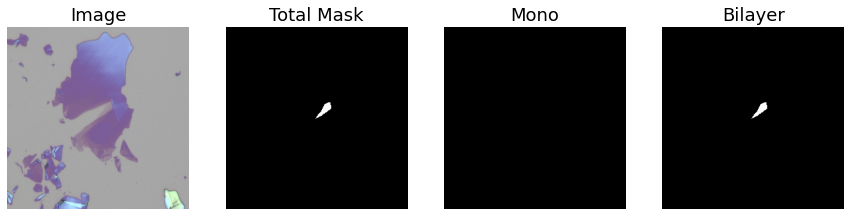

28


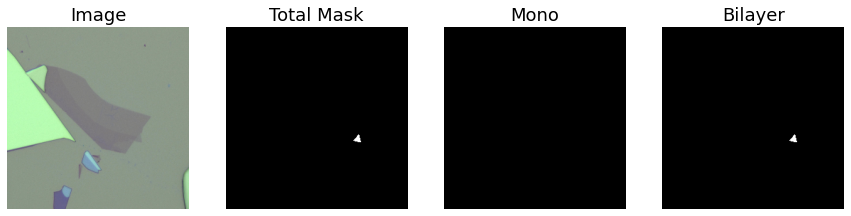

29


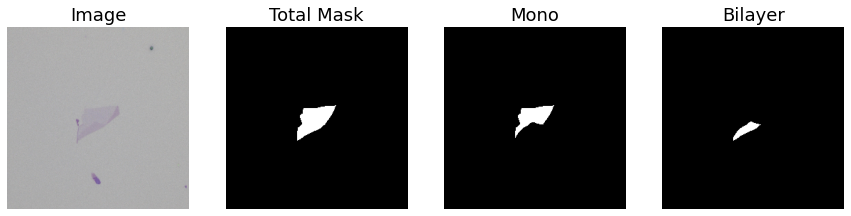

30


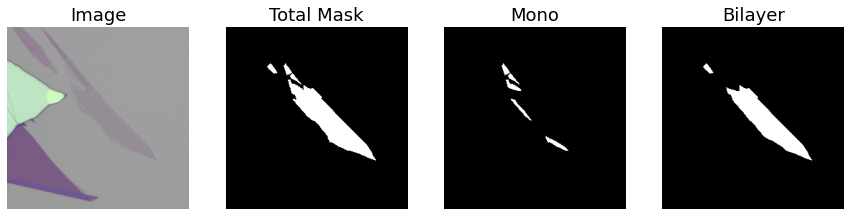

31


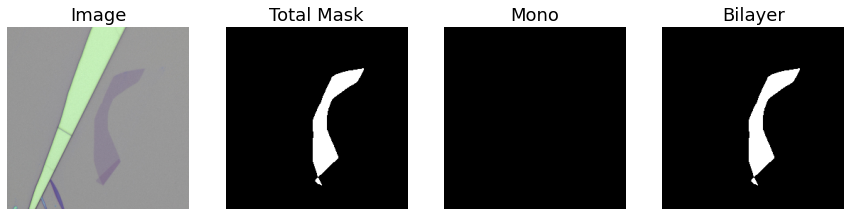

32


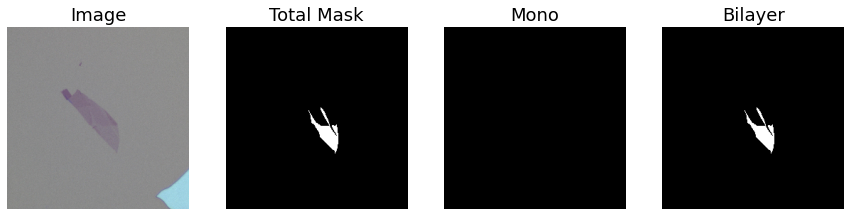

33


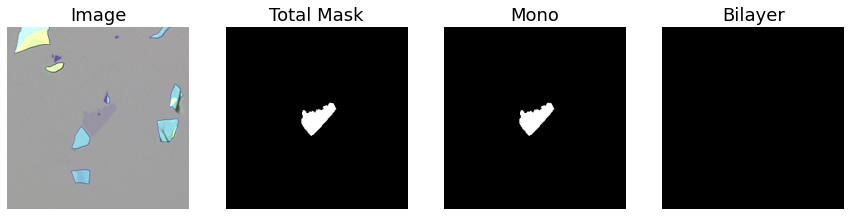

34


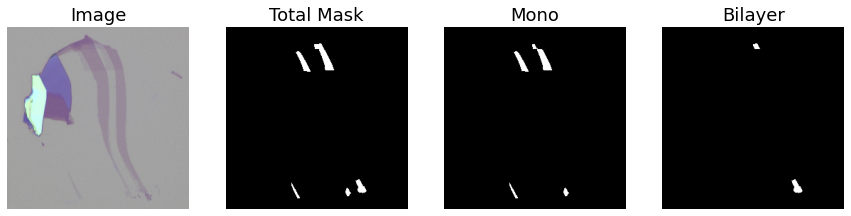

35


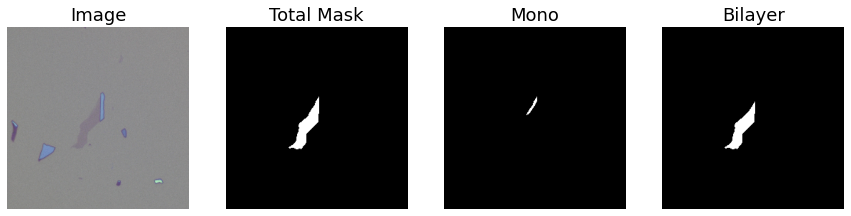

36


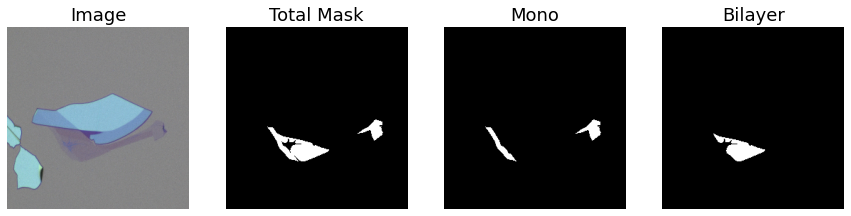

37


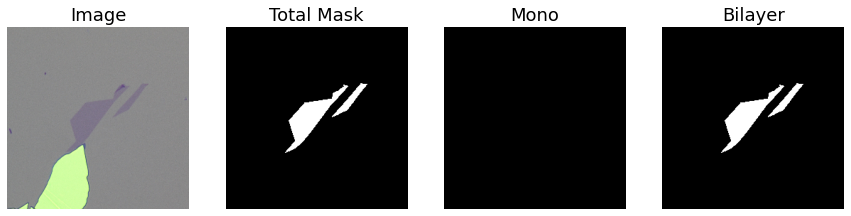

38


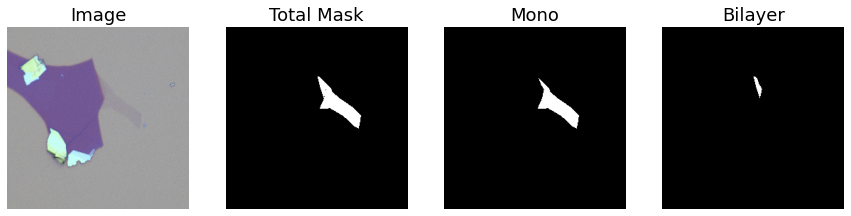

39


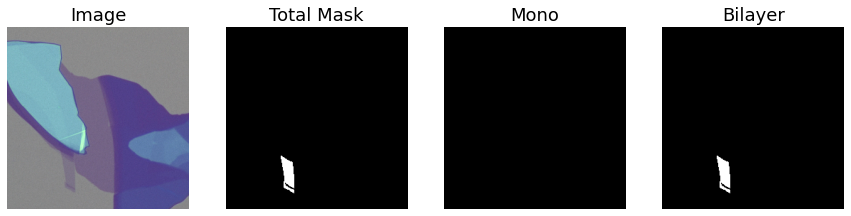

40


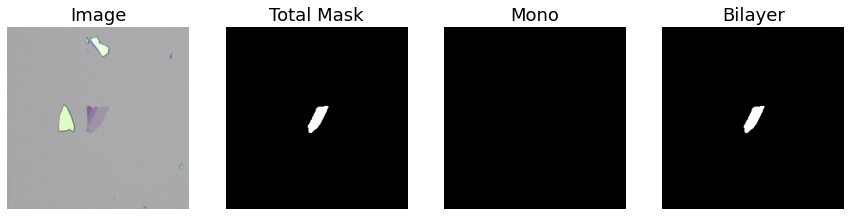

41


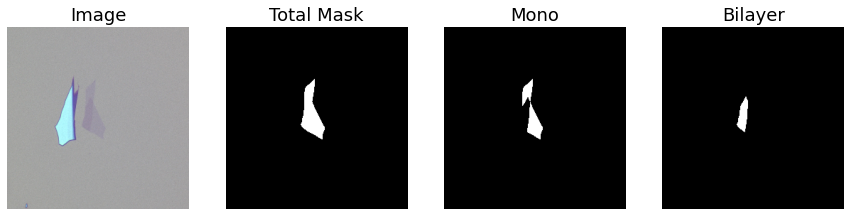

42


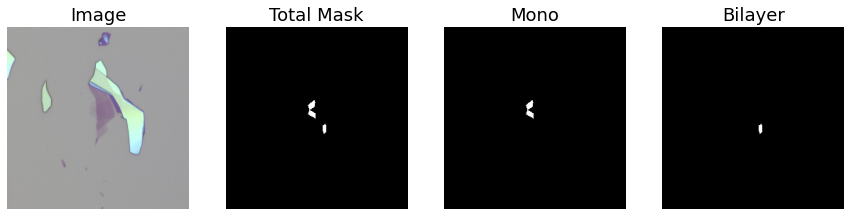

43


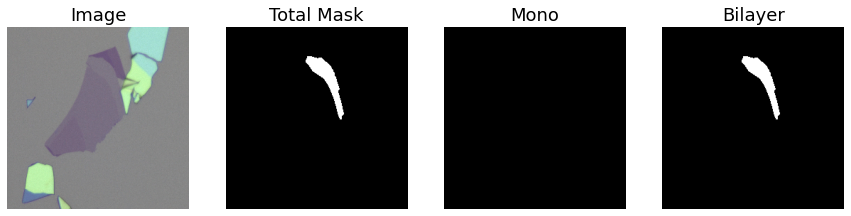

44


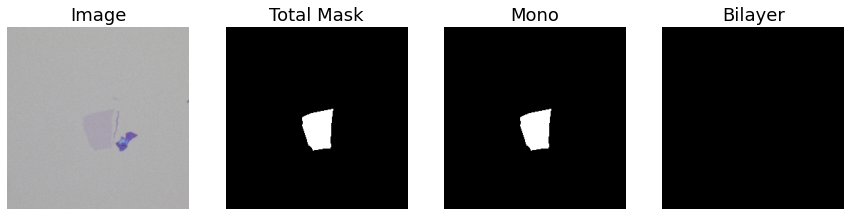

45


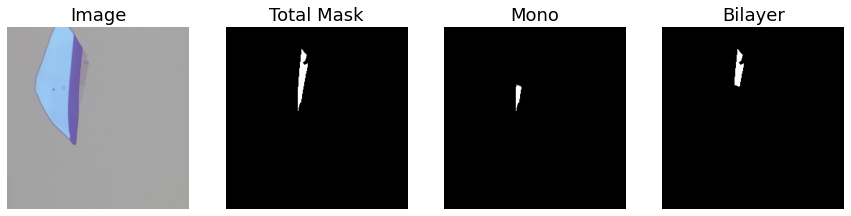

46


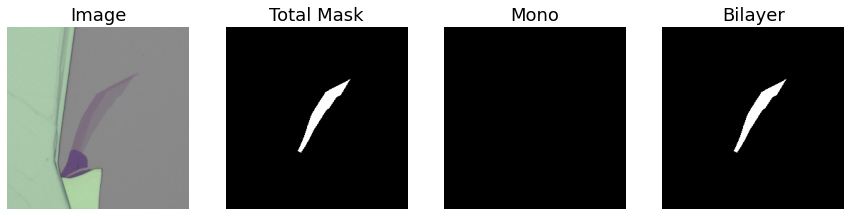

47


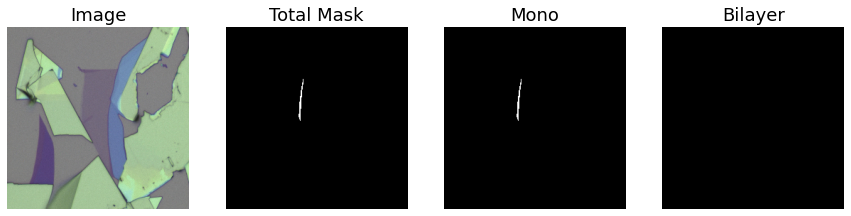

48


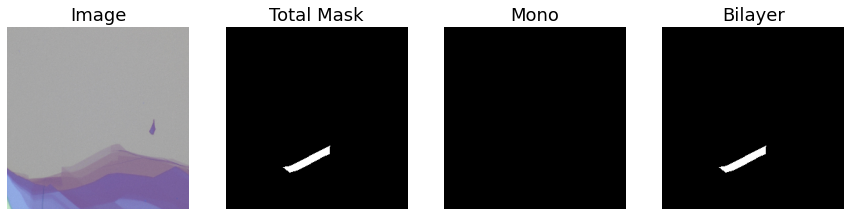

49


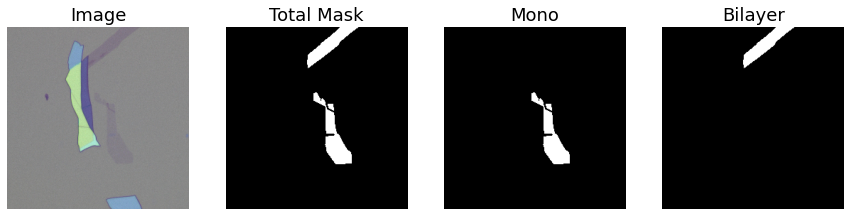

50


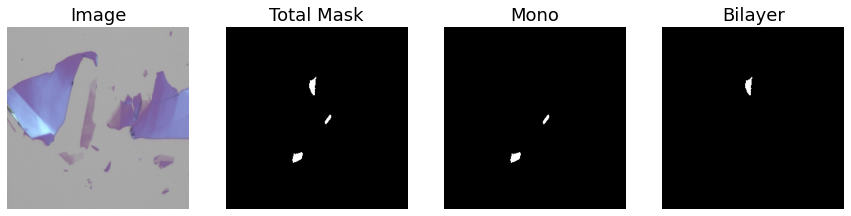

51


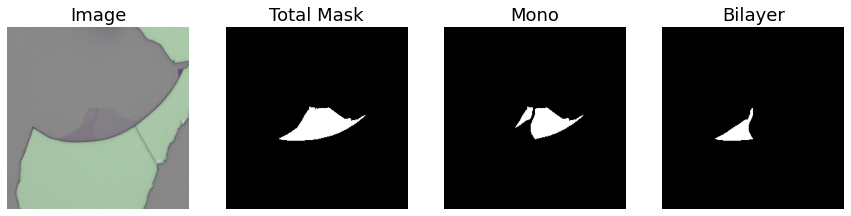

52


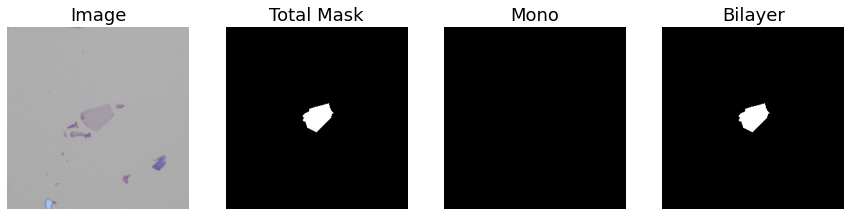

53


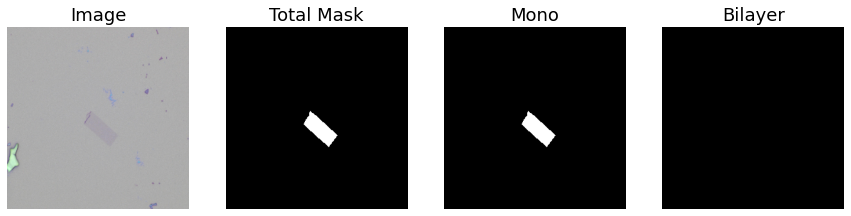

54


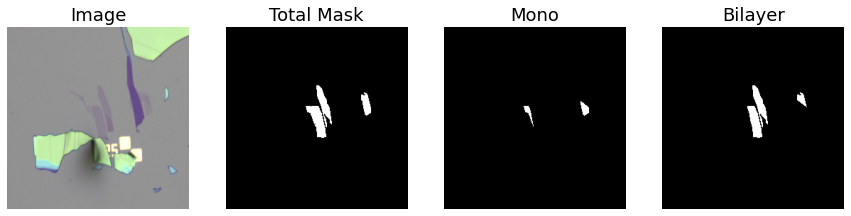

55


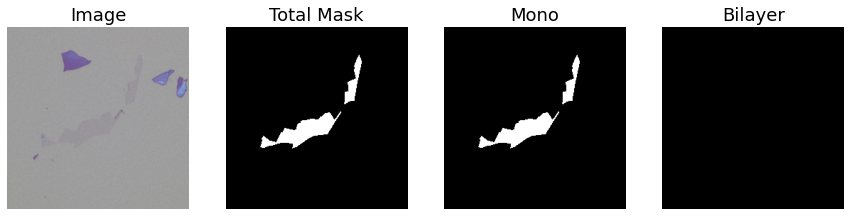

56


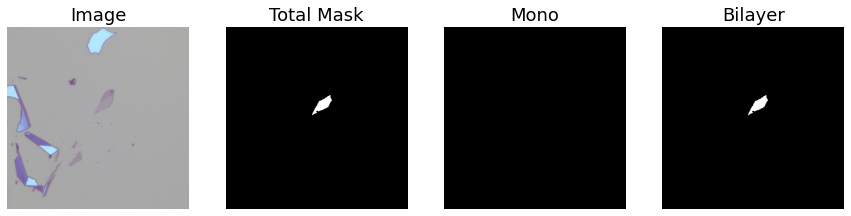

In [ ]:
for j in range(57):
  raw = cv2.resize(dataset_val.load_image(j),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
  mask = np.clip(np.sum(dataset_val.load_mask(j)[0],axis=-1,keepdims=True),a_min=0,a_max=1)
  mask = cv2.resize(mask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mask[mask != 0 ] = 1

  # Ground truth monolayer
  mmask = np.clip(np.sum(dataset_val.load_mask(j)[0][:,:,[i for i in range(len(dataset_val.load_mask(j)[1])) if dataset_val.load_mask(j)[1][i]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mmask[mmask != 0 ] = 1
 
  

  # Ground truth bilayer
  bmask = np.clip(np.sum(dataset_val.load_mask(j)[0][:,:,[i for i in range(len(dataset_val.load_mask(j)[1])) if dataset_val.load_mask(j)[1][i]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1
 

  print(j)
  fig, ax = plt.subplots(1,4,figsize=(15,60))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw)
  ax[0].set_title('Image',fontsize=18)
  ax[1].imshow(mask,cmap='gray')
  ax[1].set_title('Total Mask',fontsize=18)
  ax[2].imshow(mmask,cmap='gray')
  ax[2].set_title('Mono',fontsize=18)
  ax[3].imshow(bmask,cmap='gray')
  ax[3].set_title('Bilayer',fontsize=18)
  plt.show()


# BT-Net Evaluation Metrics


In [ ]:
def similarity(img1,img2):
    n=0
    for i in range(np.shape(img1)[0]):
        for j in range(np.shape(img1)[1]):
            if img1[i,j]==img2[i,j]:
                n=n+1
    return n/(np.shape(img1)[0]*np.shape(img1)[1])
            
def recall(img1,img2):
    n=0
    n1=0
    for i in range(np.shape(img1)[0]):
        for j in range(np.shape(img1)[1]):
            if img2[i,j]==1 and img1[i,j]==1:
                n=n+1
            if img1[i,j]==1:
                n1=n1+1
    if n1 == 0:
      n1 = 1
    return n/n1

            
def falsealarm(img1,img2):
    n=0
    n1=0
    for i in range(np.shape(img1)[0]):
        for j in range(np.shape(img1)[1]):
            if img2[i,j]==1 and img1[i,j]==0:
                n=n+1
            if img1[i,j]==0:
                n1=n1+1
    return n/n1

# Generator function for BT-Net


In [ ]:
# Define an image generator function
def image_generator_RGB(dataset, seq = None, batch_size = 32, image_size = (1024,1024)):

  while True:
    
    # Extract a random batch 
    batch = np.random.choice(dataset.image_ids, size = batch_size)    
    
    # Variables for collecting batches of inputs and outputs 
    batch_x = [] # input images for the model
    batch_y = [] # ground truth RGB max and min values for the monolayer graphene
    
    if seq: # apply augmentation
      # make stochastic augmenter deterministic (similar to drawing random samples from a distribution)
        seq_det = seq.to_deterministic()

    for f in batch: 
        # preprocess the raw images 
        raw = dataset.load_image(f) # load raw images from the coco dataset
        raw = np.clip(cv2.resize(raw, dsize = image_size, interpolation = cv2.INTER_CUBIC), 0, 255)/255 # resize the image into 256*256
        detect_mask = model_attached.predict(np.expand_dims(raw, 0)).squeeze() 
        masked_raw_image = detect_mask[:,:,None] * raw # input dataset for the BT- Net
        
        # get the ground truth masks
        gt_mask = dataset.load_mask(f) # load ground truth masks from the coco dataset
        mono_mask = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] == 2]], axis = -1, keepdims = True), a_min = 0, a_max = 1) # gt_mask[1][i] == 2, here 2 means monolayer
        mono_mask = cv2.resize(mono_mask.astype(np.float32), dsize = image_size, interpolation = cv2.INTER_CUBIC)

        # segment the ground truth monolayer on raw images
        masked_mono = mono_mask[:,:,None] * masked_raw_image

        # Upper bound or maximum RGB values (index: 0~2 ) 
        RGB_ul = np.ones(6) 
        RGB_ul[0]=np.max(masked_mono[:,:,0])
        RGB_ul[1]=np.max(masked_mono[:,:,1])
        RGB_ul[2]=np.max(masked_mono[:,:,2])

        # masked_mono_w_back stands for the masked mono with background value = 255
        # and is used to get the minimum RGB values
        masked_mono_w_back = (1 - mono_mask)[:,:,None] + masked_mono
     
        # Lower bound RGB or minimum RGB values (index:3~5) 
        RGB_ul[3]=np.min(masked_mono_w_back[:,:,0])
        RGB_ul[4]=np.min(masked_mono_w_back[:,:,1])
        RGB_ul[5]=np.min(masked_mono_w_back[:,:,2])

        # preprocess the mask 
        batch_x.append(masked_raw_image)
        batch_y.append(RGB_ul)

    # preprocess a batch of images and masks in the form of array
    batch_x = np.array(batch_x)
    batch_y = np.array(batch_y)

    if seq:
        # augment raw images
        batch_x = np.array(seq_det.augment_images(batch_x))

    yield (batch_x, batch_y)

# build train and test generators 
train_generator_RGB = image_generator_RGB(dataset_train,seq = seq_train, batch_size = batch_size, image_size=default_input_size[:2])
test_generator_RGB  = image_generator_RGB(dataset_val,seq = None, batch_size = batch_size, image_size=default_input_size[:2])


# Bi-threshold Net(BT- Net) Architecture

In [ ]:
model_BT=keras.models.load_model(RGB_model_path)

In [ ]:
# import the libraries 
from keras.models import Sequential
from keras.layers import LeakyReLU
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout

# 1. Define hyperparameters
initial_epoch = 300
epochs = 300

# 2. Define a Keras model for BT- Net. (modified from a classifier model) 
def make_model():

    NUM_CLASSES = 6 # each class stands for a max or min RGB value

    model = Sequential()  # start feed-forward model definition
    #conv2D_1
    model.add(keras.layers.Conv2D(filters=16, kernel_size=3, padding='same', input_shape=(256, 256, 3)))  # first layer needs to define "input_shape"
    model.add(LeakyReLU(0.2))

    #conv2D_2
    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.2))

    # maxpool_1
    model.add(MaxPooling2D(pool_size=(2,2))) 
    model.add(Dropout(0.2))

    #conv2D_3
    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.2))

    #conv2D_4
    model.add(keras.layers.Conv2D(filters=64, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.2))

    # maxpool_2
    model.add(MaxPooling2D(pool_size=(2,2)))  
    model.add(Dropout(0.2))
    model.add(Flatten()) 

    model.add(Dense(256))
    model.add(LeakyReLU(0.2))
    model.add(Dropout(0.2))
    
    model.add(Dense(NUM_CLASSES))  # 6 neurons in the last layer 
    model.add(LeakyReLU(0.2)) 
    model.add(Activation("sigmoid"))  # 6 outputs stand for the 6 max an min RGB values
    
    return model

# 3. Compile Keras Model.
model_BT = make_model()
model_BT.summary() # show the model architecture

opt = keras.optimizers.Adam(learning_rate=0.0004) # use Adam as the optimizer
model_BT.compile(loss = 'mean_absolute_error', optimizer= opt, metrics=['accuracy'])

# 4. Fit Keras Model.
history = model_BT.fit(train_generator_RGB, 
          epochs = epochs,
          initial_epoch = initial_epoch,
          steps_per_epoch = train_steps,
          validation_data = test_generator_RGB,
          validation_steps = test_steps)

# Plot the loss for the training and the validation process    
#plt.rcParams.update({'font.size': 14})
#plt.plot(history.history['loss'])
#plt.plot(history.history['val_loss'])
#plt.ylabel('loss')
#plt.xlabel('epoch')
#plt.legend(['train', 'test'], loc='upper right')
#plt.show()



Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_24 (Conv2D)           (None, 256, 256, 16)      448       
_________________________________________________________________
leaky_re_lu_36 (LeakyReLU)   (None, 256, 256, 16)      0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 256, 256, 32)      4640      
_________________________________________________________________
leaky_re_lu_37 (LeakyReLU)   (None, 256, 256, 32)      0         
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 128, 128, 32)      0         
_________________________________________________________________
dropout_18 (Dropout)         (None, 128, 128, 32)      0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 128, 128, 32)     

# Save the BT-Net model

In [ ]:
# Save the model if training new models
#model_BT.save(RGB_model_path)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: UserWarning: Viewer requires Qt
  from ipykernel import kernelapp as app


RGBnn time: 0.13277578353881836
[127.859245 128.84286  127.17673  127.00062  127.579155 127.48325 ]


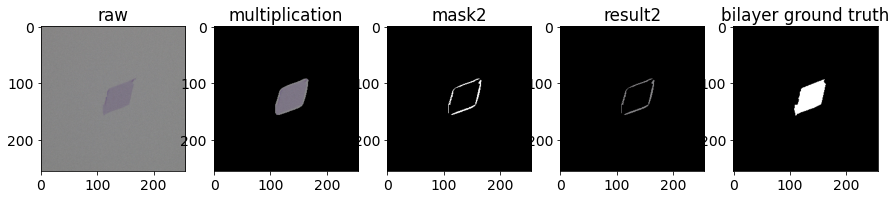

bilayer Exp mask2 accuracy: 0.9646148681640625 detection rate: 0.018658598083711547 false alarm 0.005869117114849024
RGBnn time: 0.035181283950805664
[130.08061 127.4444  128.10934 128.81914 128.29361 127.94964]


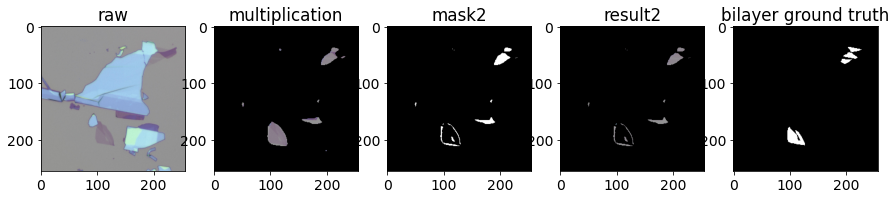

bilayer Exp mask2 accuracy: 0.982452392578125 detection rate: 0.3558792924037461 false alarm 0.008222996515679443
RGBnn time: 0.032503366470336914
[127.64479  127.47262  127.38163  127.589966 127.561104 127.43198 ]


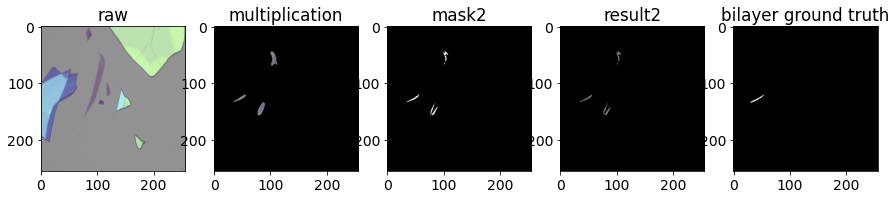

bilayer Exp mask2 accuracy: 0.9970855712890625 detection rate: 0.28846153846153844 false alarm 0.002351719504000977
RGBnn time: 0.03157830238342285
[128.37953 128.87517 129.10359 126.92299 127.34516 127.39324]


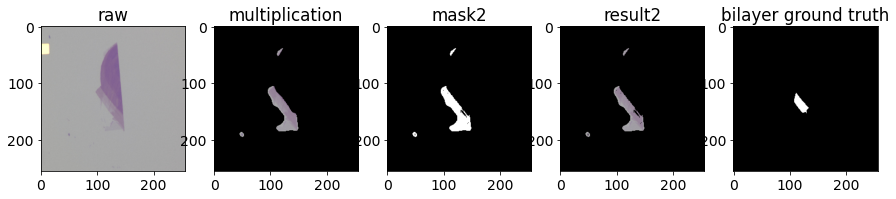

bilayer Exp mask2 accuracy: 0.9790496826171875 detection rate: 0.9507042253521126 false alarm 0.020764859468591614
RGBnn time: 0.03193521499633789
[127.43747 127.25241 128.92258 126.80321 127.05787 127.29863]


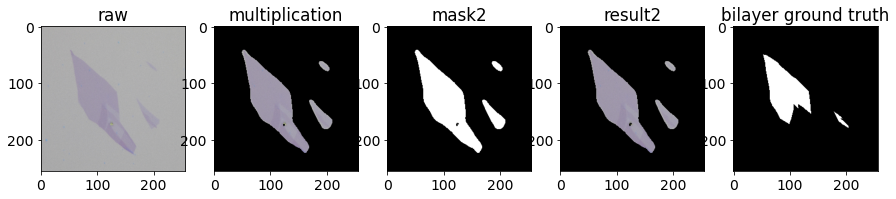

bilayer Exp mask2 accuracy: 0.9431610107421875 detection rate: 0.99962469506474 false alarm 0.06183666351088744
RGBnn time: 0.033095359802246094
[129.15016 128.8727  128.42493 127.34164 127.45674 127.53169]


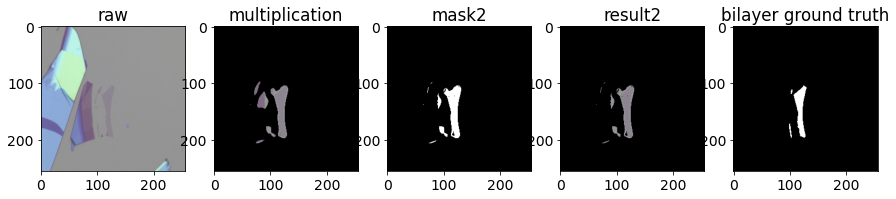

bilayer Exp mask2 accuracy: 0.9889068603515625 detection rate: 0.9571948998178507 false alarm 0.010552779415872621
RGBnn time: 0.0323026180267334
[127.766975 127.49444  127.2004   127.372696 127.39254  128.32281 ]


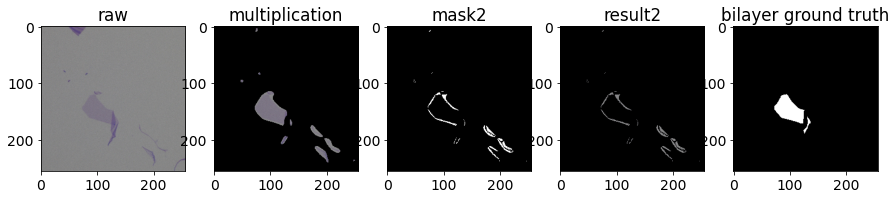

bilayer Exp mask2 accuracy: 0.9628448486328125 detection rate: 0.009512485136741973 false alarm 0.012043098318038025
RGBnn time: 0.03338050842285156
[128.30692 127.32506 127.28683 127.32727 127.37098 127.40825]


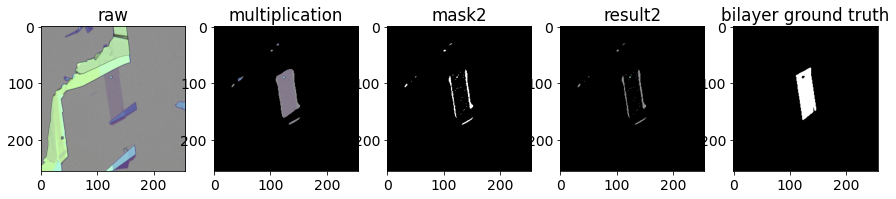

bilayer Exp mask2 accuracy: 0.9633941650390625 detection rate: 0.04736842105263158 false alarm 0.006430665447782366
RGBnn time: 0.03372764587402344
[127.970795 128.3107   127.36507  127.229454 127.38207  127.39306 ]


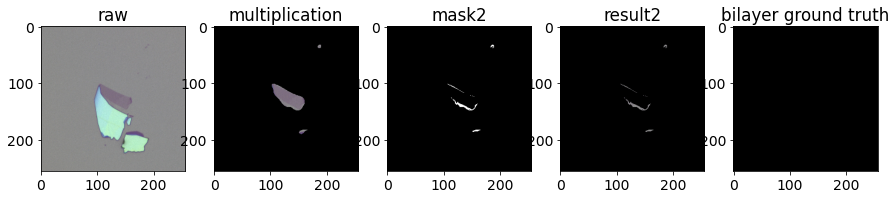

bilayer Exp mask2 accuracy: 0.9963836669921875 detection rate: 0.0 false alarm 0.0036163330078125
RGBnn time: 0.032250404357910156
[130.21463 127.46086 127.56213 126.7944  127.45668 128.60547]


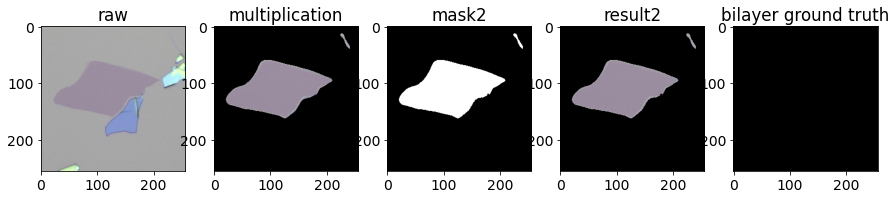

bilayer Exp mask2 accuracy: 0.83160400390625 detection rate: 0.0 false alarm 0.16839599609375
RGBnn time: 0.03188276290893555
[127.73804 129.5107  128.12051 127.28475 127.89609 127.30387]


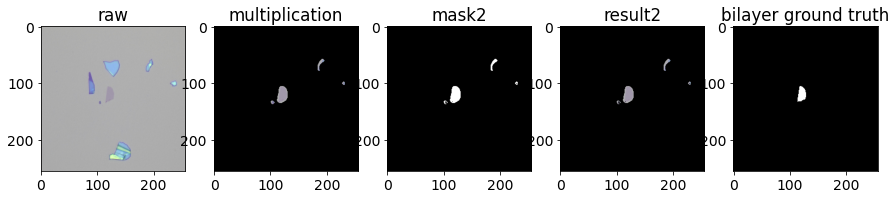

bilayer Exp mask2 accuracy: 0.9959259033203125 detection rate: 1.0 false alarm 0.004093145896889516
RGBnn time: 0.031926870346069336
[127.45308  128.26598  128.38362  126.94575  127.26039  127.257645]


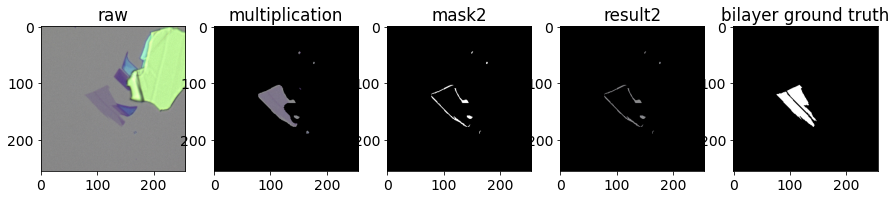

bilayer Exp mask2 accuracy: 0.965606689453125 detection rate: 0.023883696780893044 false alarm 0.005879578682597076
RGBnn time: 0.033453941345214844
[127.63626  129.20233  127.33879  127.056816 127.9984   127.432434]


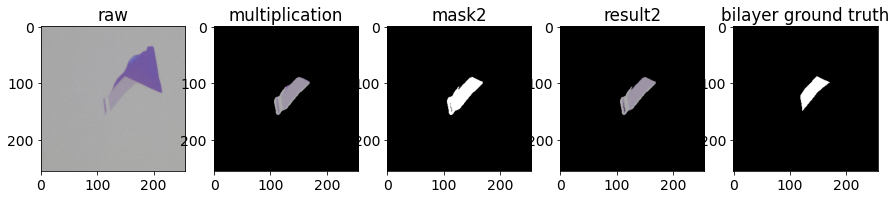

bilayer Exp mask2 accuracy: 0.991119384765625 detection rate: 0.9812703583061889 false alarm 0.008692542140946695
RGBnn time: 0.031436920166015625
[127.530426 127.99376  127.39506  127.066765 127.0682   127.80245 ]


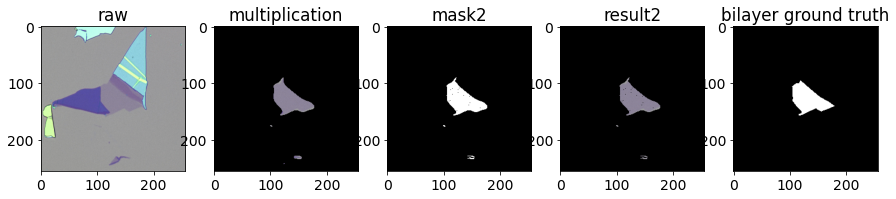

bilayer Exp mask2 accuracy: 0.99420166015625 detection rate: 0.9191655801825294 false alarm 0.003067921246145331
RGBnn time: 0.03403949737548828
[128.30862 128.38116 126.96599 127.28941 129.10236 128.15643]


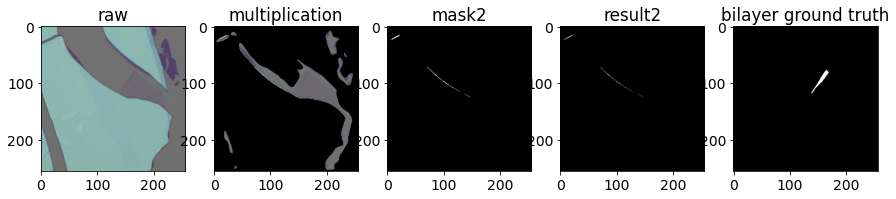

bilayer Exp mask2 accuracy: 0.99542236328125 detection rate: 0.0 false alarm 0.001347131222827751
RGBnn time: 0.03183293342590332
[129.14114  129.90773  128.13959  127.116875 128.60526  127.45279 ]


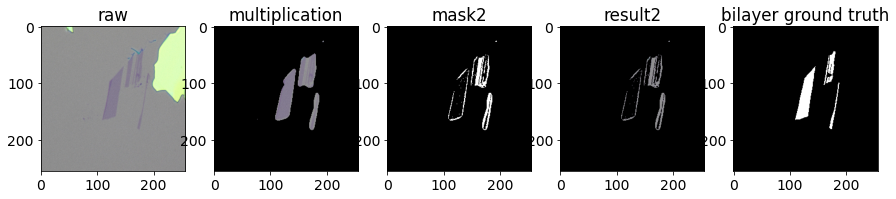

bilayer Exp mask2 accuracy: 0.9515228271484375 detection rate: 0.14304812834224598 false alarm 0.0198129305441446
RGBnn time: 0.03200507164001465
[127.438705 129.48535  127.52126  126.9238   127.224594 128.26959 ]


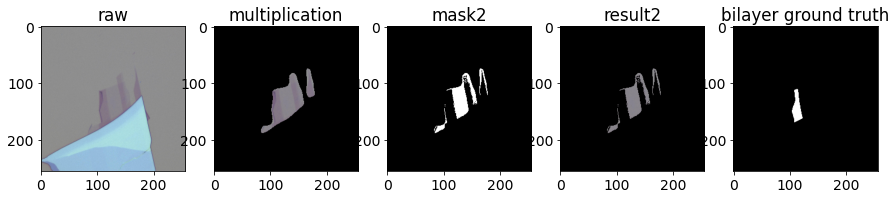

bilayer Exp mask2 accuracy: 0.9594879150390625 detection rate: 0.027419354838709678 false alarm 0.031610080719699306
RGBnn time: 0.03280019760131836
[130.23666  127.226814 127.33667  127.25803  127.2455   127.30465 ]


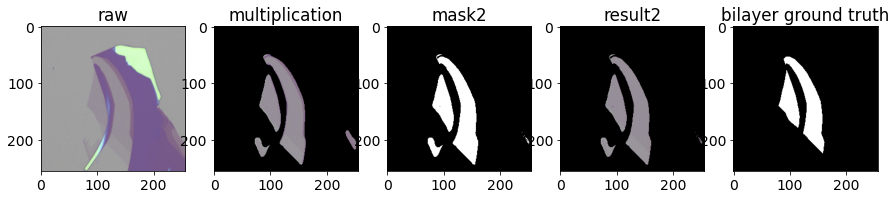

bilayer Exp mask2 accuracy: 0.9739837646484375 detection rate: 0.9872924432395798 false alarm 0.02733340040916256
RGBnn time: 0.03209376335144043
[127.64121  128.12375  127.27648  127.265816 127.31169  127.67289 ]


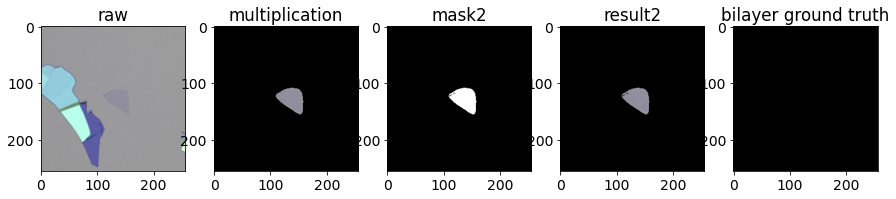

bilayer Exp mask2 accuracy: 0.977447509765625 detection rate: 0.0 false alarm 0.022552490234375
RGBnn time: 0.033371925354003906
[127.97534  128.7756   127.14901  127.35201  127.253975 127.49313 ]


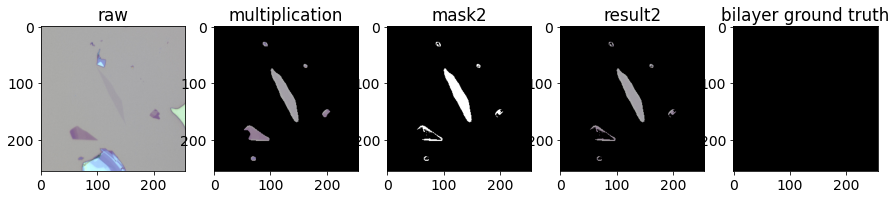

bilayer Exp mask2 accuracy: 0.970611572265625 detection rate: 0.0 false alarm 0.029388427734375
RGBnn time: 0.03222966194152832
[127.42265  127.49792  127.272934 127.095406 127.328384 127.48465 ]


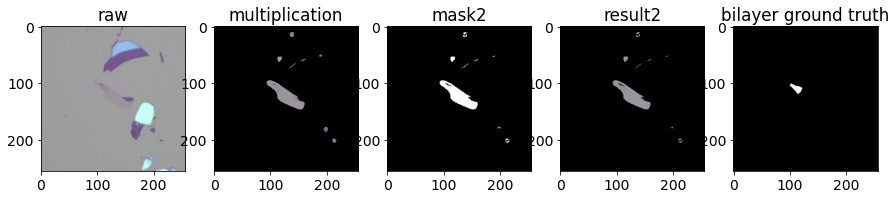

bilayer Exp mask2 accuracy: 0.9808807373046875 detection rate: 0.9787234042553191 false alarm 0.01911305625267797
RGBnn time: 0.03229951858520508
[127.48007  128.86914  126.891426 127.47657  129.00603  127.11954 ]


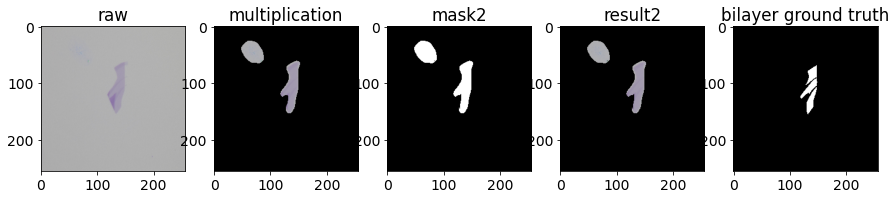

bilayer Exp mask2 accuracy: 0.97161865234375 detection rate: 0.9784845650140318 false alarm 0.028495199094110166
RGBnn time: 0.03222322463989258
[128.23239  127.43607  127.098946 127.140724 127.42143  127.42056 ]


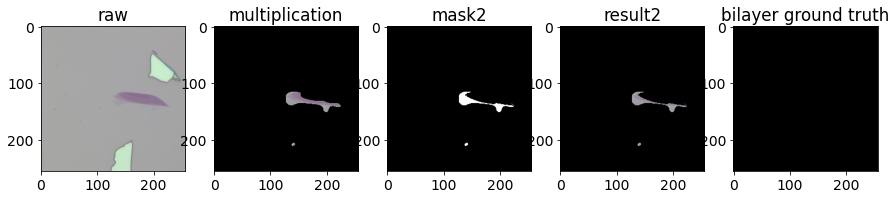

bilayer Exp mask2 accuracy: 0.9884033203125 detection rate: 0.0 false alarm 0.0115966796875
RGBnn time: 0.03210020065307617
[128.67389  128.38588  127.37652  127.314644 128.15652  127.31401 ]


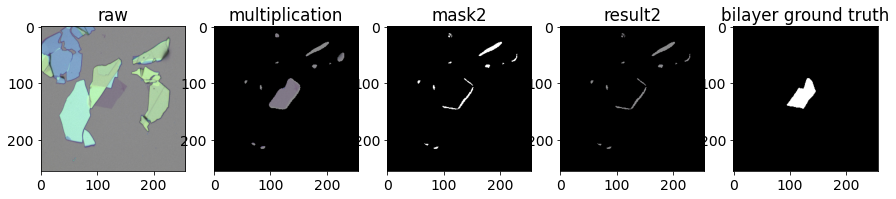

bilayer Exp mask2 accuracy: 0.96905517578125 detection rate: 0.0 false alarm 0.010686356980403154
RGBnn time: 0.0348055362701416
[127.32687 129.13553 128.01021 127.32614 127.41353 127.39915]


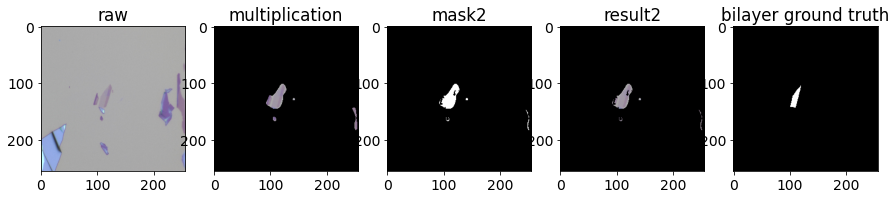

bilayer Exp mask2 accuracy: 0.99212646484375 detection rate: 1.0 false alarm 0.007911804842147227
RGBnn time: 0.03554844856262207
[127.69355  127.578125 127.71691  127.08582  127.36314  127.80705 ]


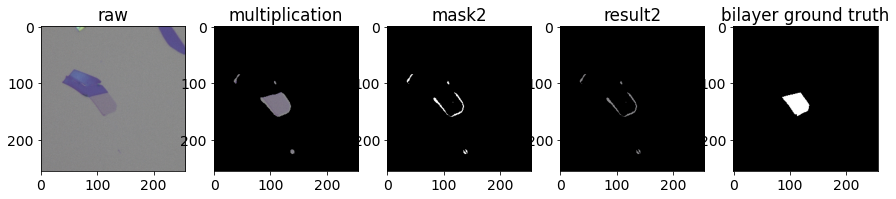

bilayer Exp mask2 accuracy: 0.97808837890625 detection rate: 0.021570319240724764 false alarm 0.0046911163925004275
RGBnn time: 0.03389286994934082
[131.77824  127.299835 127.1447   126.42658  128.29059  127.24017 ]


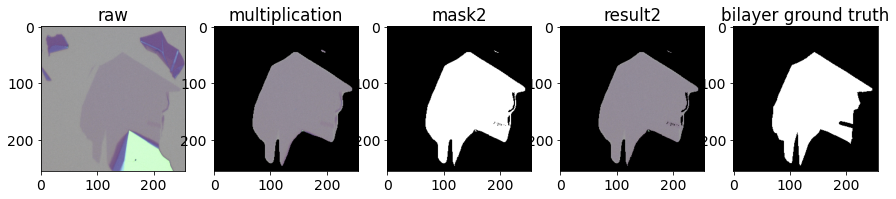

bilayer Exp mask2 accuracy: 0.98333740234375 detection rate: 0.9972251308900524 false alarm 0.02237488155741235
RGBnn time: 0.03318953514099121
[127.92793 127.86349 127.36457 127.34865 127.44382 128.71346]


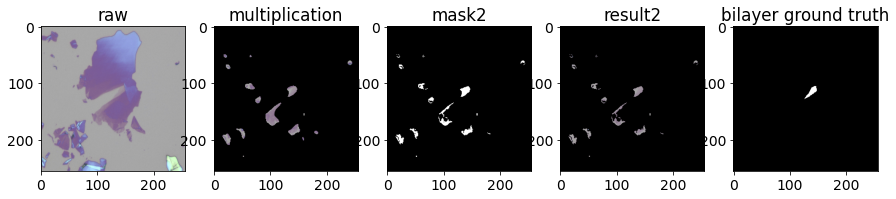

bilayer Exp mask2 accuracy: 0.985321044921875 detection rate: 0.8076923076923077 false alarm 0.014184288643388316
RGBnn time: 0.03488945960998535
[127.7553   127.371605 127.37885  127.28272  127.4656   128.43953 ]


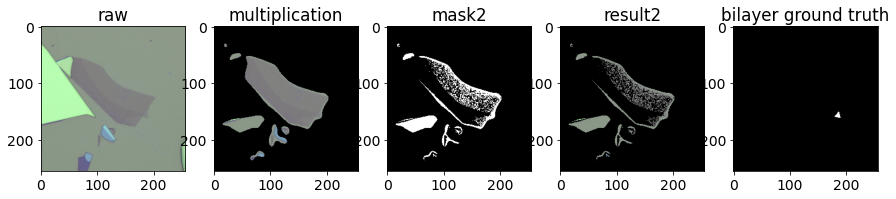

bilayer Exp mask2 accuracy: 0.9243927001953125 detection rate: 0.9384615384615385 false alarm 0.07562126743138184
RGBnn time: 0.032260894775390625
[127.52221  128.37488  127.26114  127.064545 127.386925 127.41655 ]


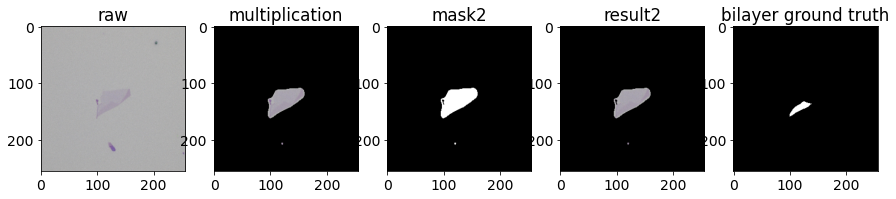

bilayer Exp mask2 accuracy: 0.9740142822265625 detection rate: 1.0 false alarm 0.026131655669786712
RGBnn time: 0.03364872932434082
[127.34061  127.90307  127.13332  126.88629  127.62009  127.871544]


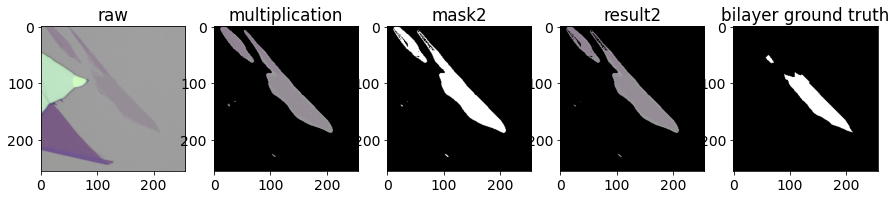

bilayer Exp mask2 accuracy: 0.9565887451171875 detection rate: 0.9939176112800664 false alarm 0.04559182157334582
RGBnn time: 0.03264212608337402
[130.20833  130.04523  127.391205 126.90006  128.75244  127.32425 ]


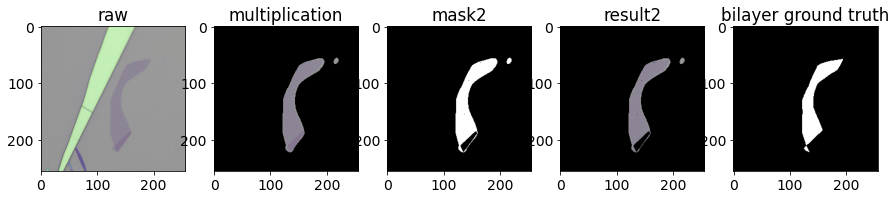

bilayer Exp mask2 accuracy: 0.9913330078125 detection rate: 0.9945429740791268 false alarm 0.008857138239239708
RGBnn time: 0.03194761276245117
[127.99233  128.07497  127.33721  127.07873  127.420654 127.458305]


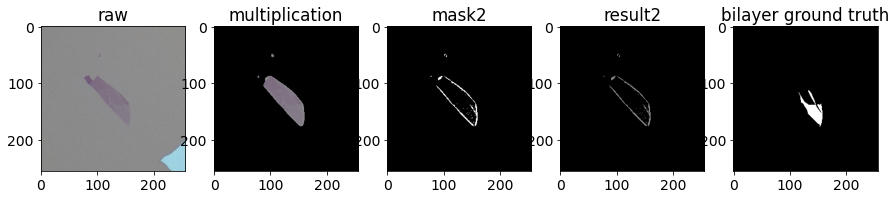

bilayer Exp mask2 accuracy: 0.980743408203125 detection rate: 0.06575963718820861 false alarm 0.006774522844680917
RGBnn time: 0.03180289268493652
[127.78506 128.10617 127.40425 127.28554 127.39254 127.40928]


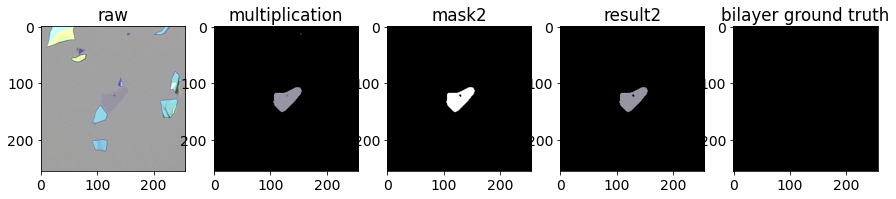

bilayer Exp mask2 accuracy: 0.9810028076171875 detection rate: 0.0 false alarm 0.0189971923828125
RGBnn time: 0.032968997955322266
[129.10028  131.47847  126.575676 126.75557  127.57056  128.11935 ]


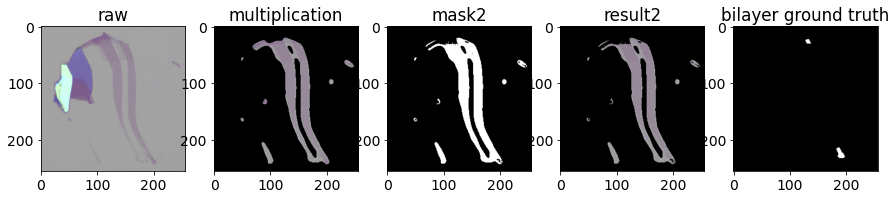

bilayer Exp mask2 accuracy: 0.8844451904296875 detection rate: 1.0 false alarm 0.11593870083742862
RGBnn time: 0.03239607810974121
[127.66727  129.2286   128.07854  127.380646 127.48512  128.48894 ]


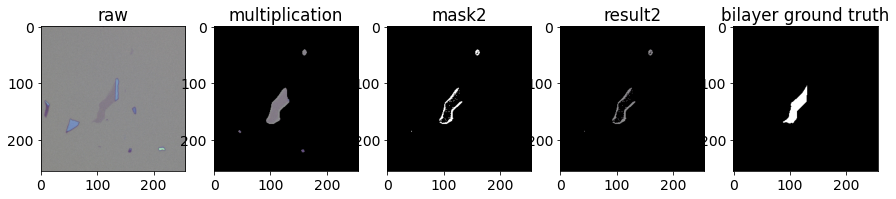

bilayer Exp mask2 accuracy: 0.982086181640625 detection rate: 0.14240506329113925 false alarm 0.0055892735492661175
RGBnn time: 0.0321502685546875
[128.4532  127.81894 128.37593 127.26836 129.16171 127.49611]


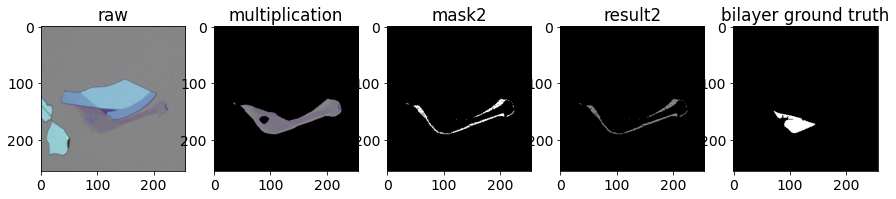

bilayer Exp mask2 accuracy: 0.9701080322265625 detection rate: 0.0 false alarm 0.012994069612196107
RGBnn time: 0.031687021255493164
[127.37713  128.94589  127.39664  127.0327   127.29965  127.508995]


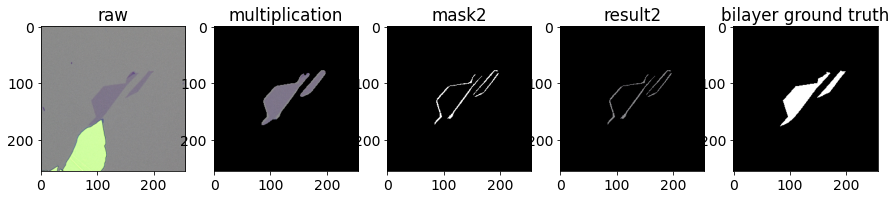

bilayer Exp mask2 accuracy: 0.949462890625 detection rate: 0.0346045197740113 false alarm 0.009217912732840011
RGBnn time: 0.03159165382385254
[127.43638 130.66183 127.31974 127.42475 129.49995 127.14205]


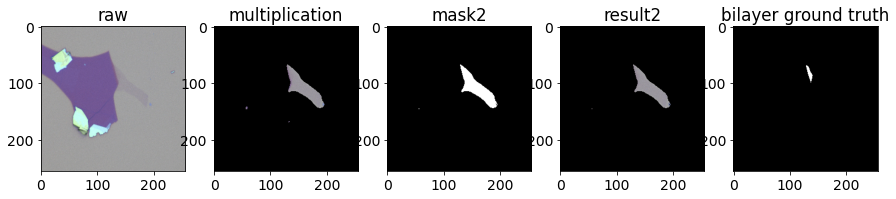

bilayer Exp mask2 accuracy: 0.9757537841796875 detection rate: 0.9305555555555556 false alarm 0.024146684609738196
RGBnn time: 0.03234601020812988
[127.49738 127.45816 127.39203 127.72157 127.76088 127.44546]


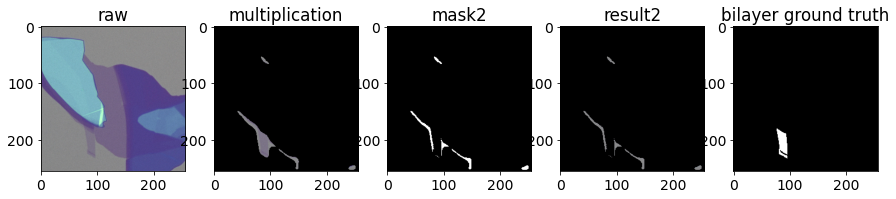

bilayer Exp mask2 accuracy: 0.9797210693359375 detection rate: 0.009630818619582664 false alarm 0.010968527105510453
RGBnn time: 0.037316322326660156
[128.06758 127.66865 127.48494 127.28037 127.44251 127.41548]


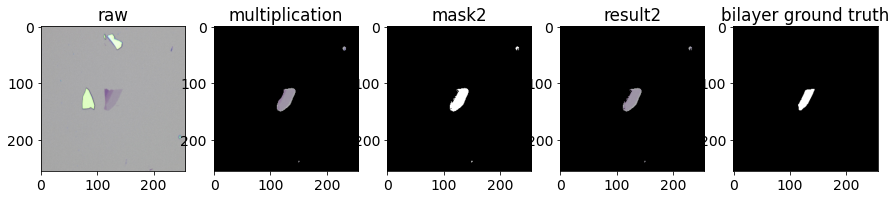

bilayer Exp mask2 accuracy: 0.996063232421875 detection rate: 0.996268656716418 false alarm 0.003938461538461538
RGBnn time: 0.0319216251373291
[127.83847 128.07443 127.4382  127.23644 127.40131 127.44789]


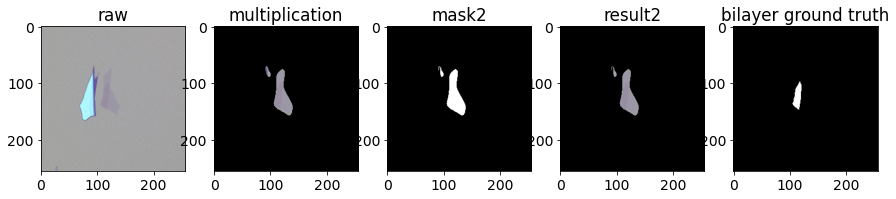

bilayer Exp mask2 accuracy: 0.983245849609375 detection rate: 0.9978768577494692 false alarm 0.016860063013909167
RGBnn time: 0.032941579818725586
[127.838135 128.16681  127.16001  127.22101  127.49767  127.39931 ]


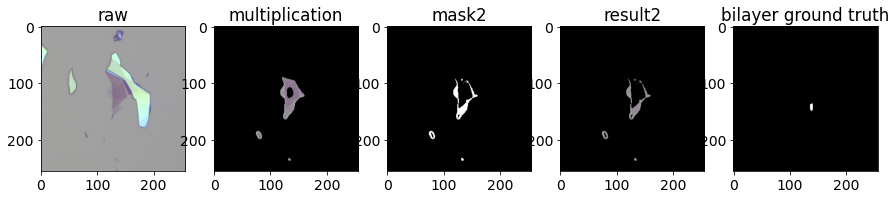

bilayer Exp mask2 accuracy: 0.9886627197265625 detection rate: 1.0 false alarm 0.011347149467768292
RGBnn time: 0.032299041748046875
[128.21747  127.86583  127.38393  127.03358  127.2901   127.390396]


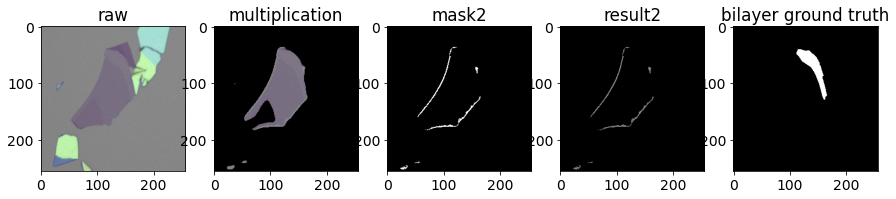

bilayer Exp mask2 accuracy: 0.96893310546875 detection rate: 0.0021321961620469083 false alarm 0.009855135742019992
RGBnn time: 0.037665367126464844
[127.788345 129.0433   127.2392   126.84703  127.14572  128.2338  ]


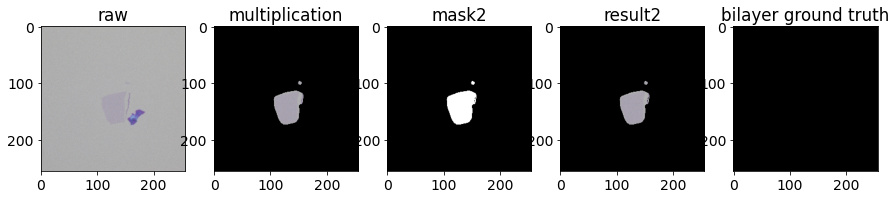

bilayer Exp mask2 accuracy: 0.963623046875 detection rate: 0.0 false alarm 0.036376953125
RGBnn time: 0.034552574157714844
[128.34338  127.43712  127.901566 127.63652  128.30637  127.36181 ]


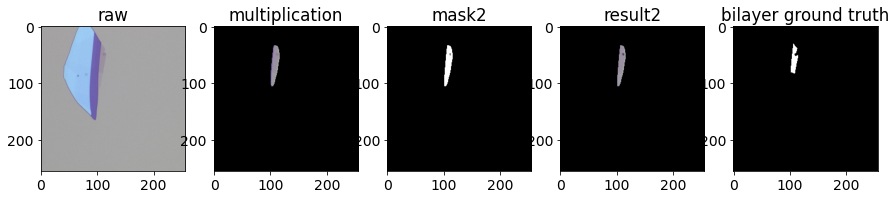

bilayer Exp mask2 accuracy: 0.9956207275390625 detection rate: 0.966183574879227 false alarm 0.004192131691287123
RGBnn time: 0.03332042694091797
[127.40268 128.97163 127.60184 126.9386  128.6242  127.61135]


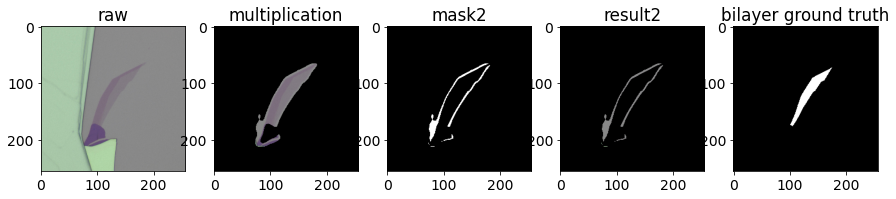

bilayer Exp mask2 accuracy: 0.960662841796875 detection rate: 0.021861777150916785 false alarm 0.018575127109392058
RGBnn time: 0.03298449516296387
[128.14325 127.8942  127.33661 127.21949 127.07255 127.41511]


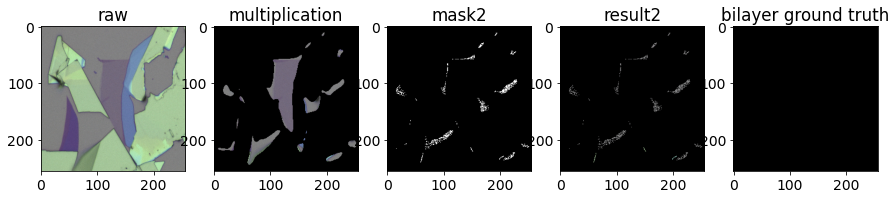

bilayer Exp mask2 accuracy: 0.98638916015625 detection rate: 0.0 false alarm 0.01361083984375
RGBnn time: 0.033353567123413086
[130.41023 128.86699 127.66345 127.50708 129.20113 127.64646]


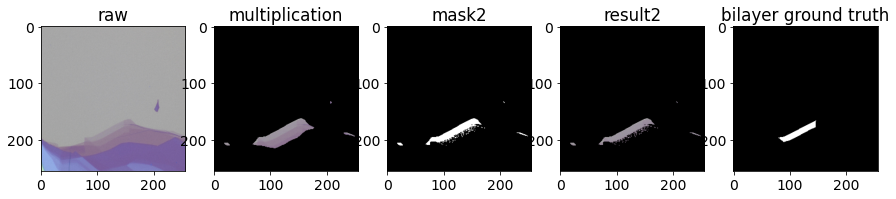

bilayer Exp mask2 accuracy: 0.990325927734375 detection rate: 1.0 false alarm 0.009775653380618303
RGBnn time: 0.03208160400390625
[127.944336 128.16837  127.349396 127.14002  127.431915 127.4065  ]


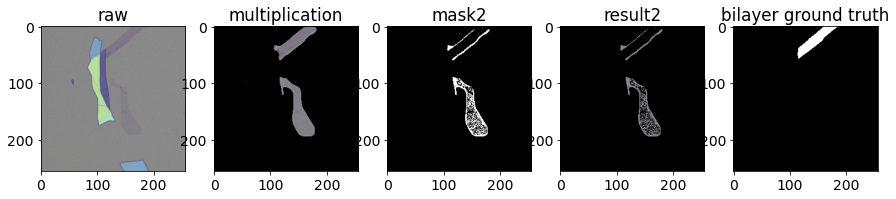

bilayer Exp mask2 accuracy: 0.953857421875 detection rate: 0.03135048231511254 false alarm 0.028292789149505383
RGBnn time: 0.03235507011413574
[127.89506 127.24992 127.32887 126.9785  127.2842  128.77937]


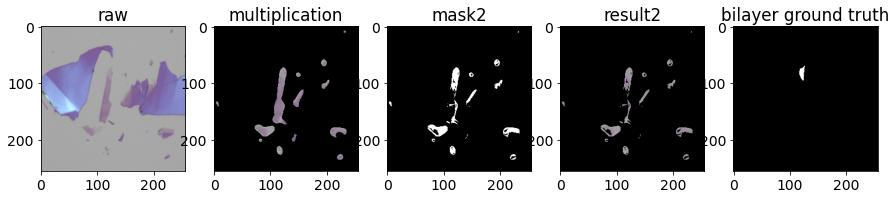

bilayer Exp mask2 accuracy: 0.9735107421875 detection rate: 0.9430379746835443 false alarm 0.026415613815044817
RGBnn time: 0.0368342399597168
[128.36209  127.428665 127.23881  126.86496  127.3882   128.48943 ]


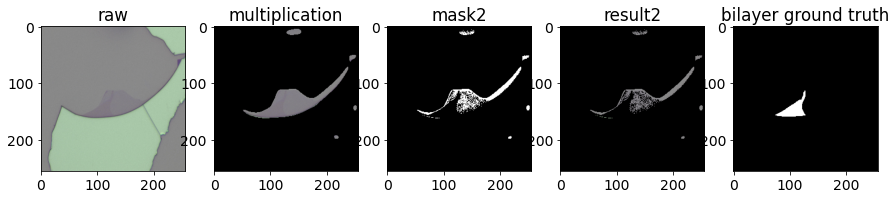

bilayer Exp mask2 accuracy: 0.9558563232421875 detection rate: 0.019845644983461964 false alarm 0.031007751937984496
RGBnn time: 0.03288626670837402
[127.482124 128.40862  127.388535 127.12712  127.64144  127.49931 ]


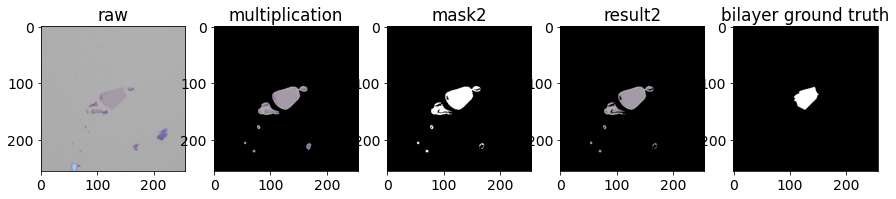

bilayer Exp mask2 accuracy: 0.986083984375 detection rate: 0.9990530303030303 false alarm 0.014128411910669976
RGBnn time: 0.033911705017089844
[129.2128  128.7391  127.31933 127.30805 129.09866 127.33306]


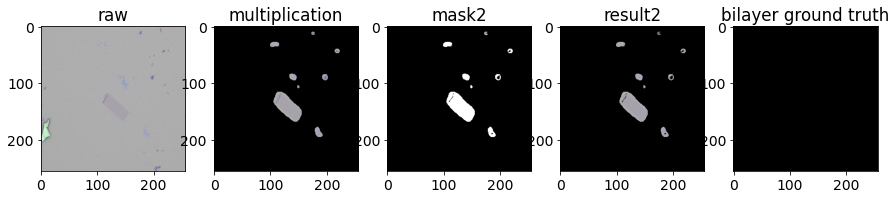

bilayer Exp mask2 accuracy: 0.9691619873046875 detection rate: 0.0 false alarm 0.0308380126953125
RGBnn time: 0.031975507736206055
[128.41037 128.10306 127.03676 127.21256 127.33724 127.45685]


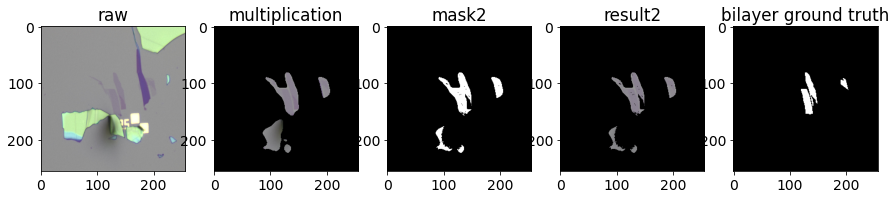

bilayer Exp mask2 accuracy: 0.9770050048828125 detection rate: 0.9494949494949495 false alarm 0.02248710138621247
RGBnn time: 0.032056331634521484
[127.919846 128.17429  127.26766  126.74899  127.20503  129.26115 ]


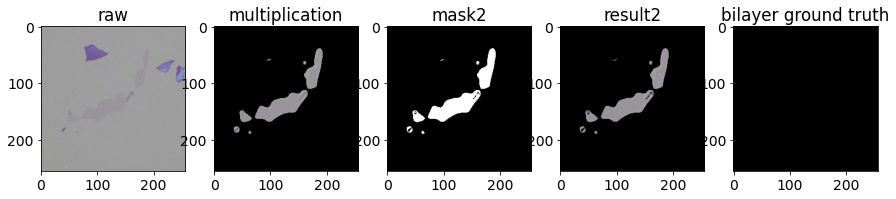

bilayer Exp mask2 accuracy: 0.9383697509765625 detection rate: 0.0 false alarm 0.0616302490234375
RGBnn time: 0.0324864387512207
[128.35925  127.384895 127.38905  127.63781  128.16882  127.95368 ]


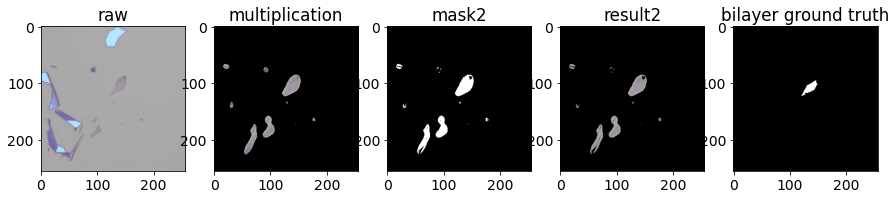

bilayer Exp mask2 accuracy: 0.9767913818359375 detection rate: 0.9935483870967742 false alarm 0.023288259283107963
0.03475679431045264
accuracy: 0.97100830078125 detection_rate: 0.5856108658285072 false_alarm: 0.022743223357548692


In [ ]:
# BGR color segmentation 
import cv2
import numpy as np
from matplotlib import pyplot as plt
import cv2
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors
from scipy import signal
import skimage
import skimage.feature
import skimage.viewer
from skimage import color
from matplotlib.colors import hsv_to_rgb

T = 0 # T is execution time
n = 0 
accuracy = 0
detection_rate = 0
false_alarm = 0

accuracy2 = 0
detection_rate2 = 0
false_alarm2 = 0
graphene = np.zeros((256,256,3))
n1 = 0
n2 = 0

for i in range(57):
  raw = cv2.resize(dataset_val.load_image(i),
                          dsize=default_input_size[:2],
                          interpolation=cv2.INTER_CUBIC)/255

  #pred1 = model.predict(np.expand_dims(raw, 0)).squeeze()
  #mask=pred1[:,:,None]*raw
  pred_mask = model_attached.predict(np.expand_dims(raw, 0)).squeeze()
  #pred1 = model.predict(np.expand_dims(mask, 0)).squeeze()
  pred_mask = (1+np.sign(pred_mask-0.844))/2
  #pred_mask = exponen(pred1)
  #pred_mask = pred1 # exponen(pred1, bias = 0, rate = 1)
  #pred_mask = linear(pred1)
  graphene = pred_mask[:,:,None] * raw
  multiply=graphene 

  graphene = graphene.astype('float32')   # opencv only works with 'float32' 
  
  pixel_colors = graphene.reshape((np.shape(graphene)[0]*np.shape(graphene)[1], 3))
  norm = colors.Normalize(vmin=-1.,vmax=1.)
  norm.autoscale(pixel_colors)
  pixel_colors = norm(pixel_colors).tolist()

  #mmask = np.clip(np.sum(dataset_val.load_mask(i)[0][:,:,[k for k in range(len(dataset_val.load_mask(i)[1])) if dataset_val.load_mask(i)[1][k]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  #mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  #mmask[mmask != 0 ] = 1

  bmask = np.clip(np.sum(dataset_val.load_mask(i)[0][:,:,[k for k in range(len(dataset_val.load_mask(i)[1])) if dataset_val.load_mask(i)[1][k]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1
  
  #detect upper bound and lower bound of RGB from tested dataset
  start = time.time()
  pred = model_BT.predict(np.expand_dims(multiply, 0))[0]
  end = time.time()
  print("RGBnn time:",end-start)
  T+=(end-start)
  print(model_BT.predict(np.expand_dims(multiply, 0))[0]*255)
  light_purple2 = (pred[3]*255,pred[4]*255,pred[5]*255) # lower bound RGB for bilayer

  dark_purple2 = (pred[0]*255,pred[1]*255,pred[2]*255) # upper bound RGB for bilayer
  dark_purple2 = (255,255,255)
# Apply color threshold range on the masks 
  Neo_image=graphene*255#/np.max(graphene)  
  #mask = cv2.inRange(Neo_image,light_purple, medium_purple)
  mask2 = cv2.inRange(Neo_image, light_purple2,dark_purple2 ) #for bilayer
 
  #result = cv2.bitwise_and(graphene, graphene, mask=mask)
  result2 = cv2.bitwise_and(graphene, graphene, mask=mask2)
  
  fig, ax = plt.subplots(nrows=1, ncols=5,figsize=(15,3))

  ax[0].imshow(raw)
  ax[0].set_title("raw")

  ax[1].set_title("multiplication")
  ax[1].imshow(multiply,cmap='gray')
  ax[2].imshow(mask2, cmap="gray")
  ax[2].set_title("mask2")
  ax[3].imshow(result2)
  ax[3].set_title("result2")
  ax[4].imshow(bmask, cmap="gray")
  ax[4].set_title("bilayer ground truth")
  plt.show()
  

  mask2 = mask2/255

  print('bilayer Exp mask2 accuracy:',similarity(bmask,mask2),'detection rate:',recall(bmask,mask2),'false alarm',falsealarm(bmask,mask2))

  accuracy2 += similarity(bmask,mask2)
  detection_rate2 += recall(bmask,mask2)
  false_alarm2 += falsealarm(bmask,mask2)
  if np.any(dataset_val.load_mask(i)[1]==1):
    n2=n2+1

accuracy2 = accuracy2/57
detection_rate2 = detection_rate2/n2
false_alarm2 = false_alarm2/57
print(T/57)
print('accuracy:',accuracy2,'detection_rate:',detection_rate2,'false_alarm:',false_alarm2)